# Titanic - Machine Learning From Disaster

---

# Initial Stage

---

***Name: Muhammed Baloum***

***ID: 322563354***

***Kaggle: https://www.kaggle.com/muhammedbaloum***

# TL;DR

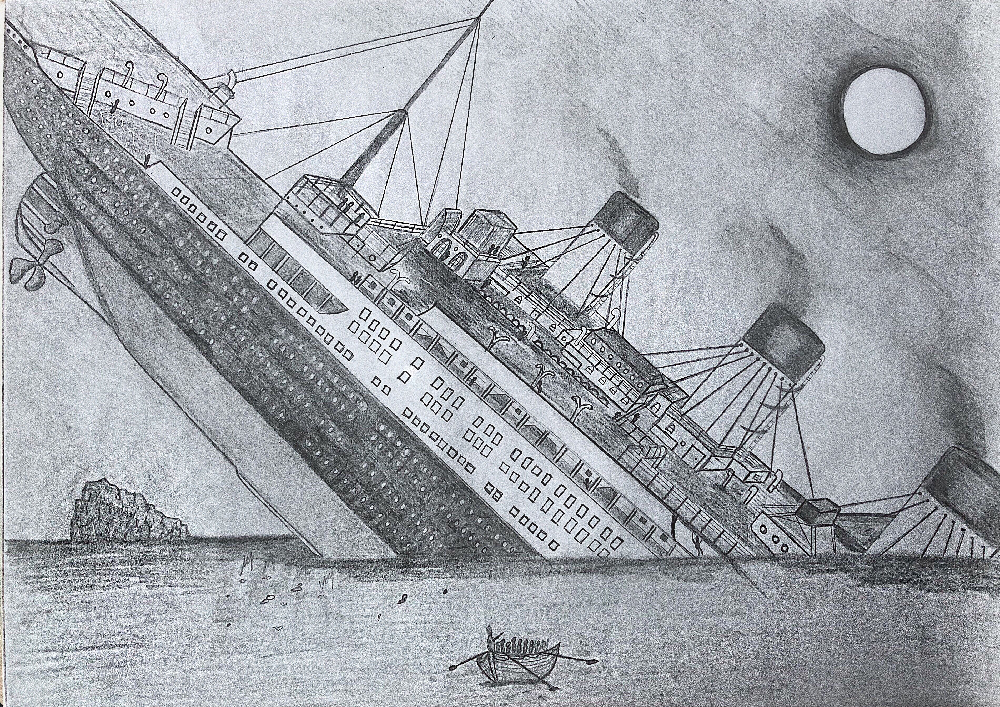

***The Titanic's sinking is one of history's most notorious maritime disasters. On April 15, 1912, the "unsinkable" RMS Titanic collided with an iceberg and sank on her maiden voyage, killing 1,502 of the 2,224 onboard due to insufficient lifeboats. Survival odds varied among passengers. 
In this competition, I developed a predictive model to determine which passengers were more likely to survive using dataset such as name, age, gender, and socio-economic class. We'll test various models and dataset splits to achieve the highest calculateAccuracy and lowest cross-entropy loss.***

# Link to the Kaggle Competition

***https://www.kaggle.com/c/titanic***

# Data Dictionary

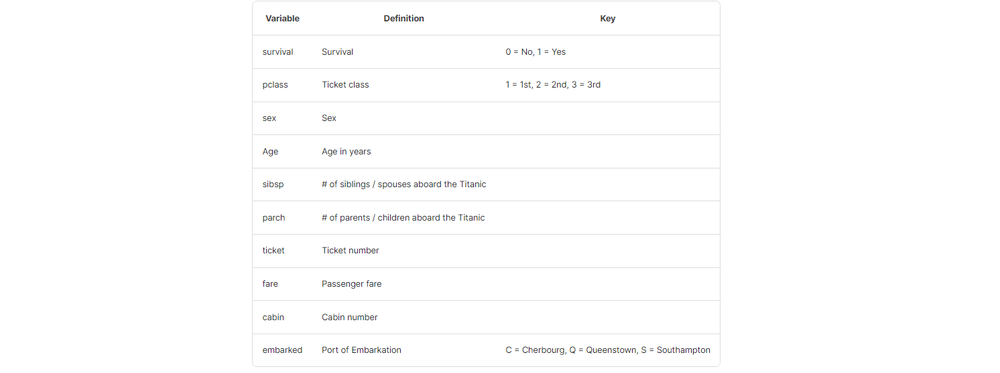

# Module Updates and Installations

In [1]:
!pip install --upgrade pip
!pip install -U scikit-learn
!pip install --upgrade matplotlib IPython
!pip install missingno

# Importing Libraries and Packages

In [2]:
# Standard library imports
import math
import warnings

# Third-party imports
import matplotlib.pyplot as pyplot
from matplotlib.colors import ListedColormap
import numpy
import pandas
import seaborn
import plotly.express as express
import plotly.graph_objects as graph_objects
from scipy.stats import uniform
from tqdm.auto import tqdm
import missingno

# Scikit-learn imports for machine learning
import sklearn
from sklearn import datasets
from sklearn import linear_model
from sklearn import metrics
from sklearn import model_selection
from sklearn import neural_network
from sklearn import pipeline
from sklearn import preprocessing

# Scikit-learn transformers and feature selection
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.feature_selection import RFECV
from sklearn.linear_model import SGDClassifier

# Scikit-learn metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

# Scikit-learn model selection
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import LeavePOut
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score

# Scikit-learn classifiers
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier

# Scikit-learn preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Settings

In [3]:
def plotStyle():
    # Initialize Seaborn's default theme for all plots
    seaborn.set_theme(style="whitegrid") 

    # Define a single dictionary for consistent Matplotlib plot settings
    pyplot.rcParams.update({
        "font.size": 20,  # Base font size
        "axes.labelsize": 20,  # Axes labels font size
        "xtick.labelsize": 20,  # X-tick labels font size
        "ytick.labelsize": 20,  # Y-tick labels font size
        "legend.fontsize": 20,  # Legend text font size
        "legend.markerscale": 1.5,  # Marker scale in legends
        "figure.figsize": (12, 10),  # Default figure size
        "legend.title_fontsize": 20  # Legend titles font size
    })

In [4]:
plotStyle()

# Disable Warnings

In [5]:
# Suppress unnecessary FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Dataset Loading

In [6]:
# Attempting to load the Titanic dataset
def loadAndDisplayDatasets(train="Repository/train.csv", test="Repository/test.csv"):
    try:
        train = pandas.read_csv(train)
        test = pandas.read_csv(test)
        submissionPassengerId = test['PassengerId']
    except FileNotFoundError:
        print("Files not found.")
    except Exception as e:
        print(f"Error: {e}")
    else:
        display(train)
        return train, test, submissionPassengerId

In [7]:
train, test, submissionPassengerId = loadAndDisplayDatasets("Repository/train.csv", "Repository/test.csv")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


# Overview of the Dataset

***Our dataset consists of 891 rows and 12 columns, featuring numerous missing values and categorical columns that necessitate imputation and encoding for use in modeling.***

# Essential Dataset Analysis 

### Feature Descriptions

- **pclass**: A proxy for socio-economic status (SES)
  - 1st = Upper
  - 2nd = Middle
  - 3rd = Lower

- **age**: 
  - Age is fractional if less than 1.
  - If the age is estimated, it is in the form of xx.5.

### Family Relations Definitions

- **sibsp**: Defines sibling and spouse relationships
  - Sibling = brother, sister, stepbrother, stepsister
  - Spouse = husband, wife (mistresses and fiancés were ignored)

- **parch**: Defines parent and child relationships
  - Parent = mother, father
  - Child = daughter, son, stepdaughter, stepson
  - Note: Some children traveled only with a nanny, therefore parch=0 for them.

# Further Dataset Insights

In [8]:
# Display information about the train dataset including the data types and number of non-null values
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


# Strategies for Handling Missing Data: Median and Random Imputation Methods

In [9]:
# This function replaces missing values in a specified column of a dataset with the median of that column.
def replaceMissingWithMedian(dataset, column):
    dataset[column].fillna(dataset[column].median(), inplace=True)

In [10]:
# This function replaces missing values in a specified column of a dataset with a random value from the non-missing values of that column.
def replaceMissingWithRandom(dataset, column):
    nonMissingData = dataset[column].dropna()
    dataset[column].fillna(numpy.random.choice(nonMissingData), inplace=True)

# Identifying Missing Values

In [11]:
# Prints the count of missing values per column in a DataFrame.
def countMissing(df: pandas.DataFrame):
    for column, missing in df.isna().sum().items():
        print(f"{column}: {missing}")

In [12]:
def displayMissingDataHeatmap(data):
    pastelColormap = ListedColormap(seaborn.color_palette("Pastel1"))
    missingno.heatmap(data, cmap=pastelColormap)
    pyplot.show()

<Axes: >

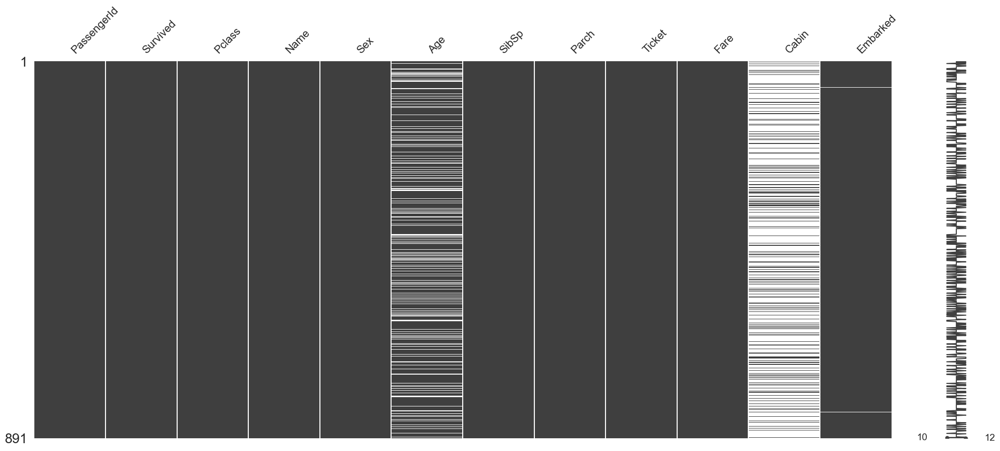

In [13]:
# Visualizing Missing Values 
missingno.matrix(train)

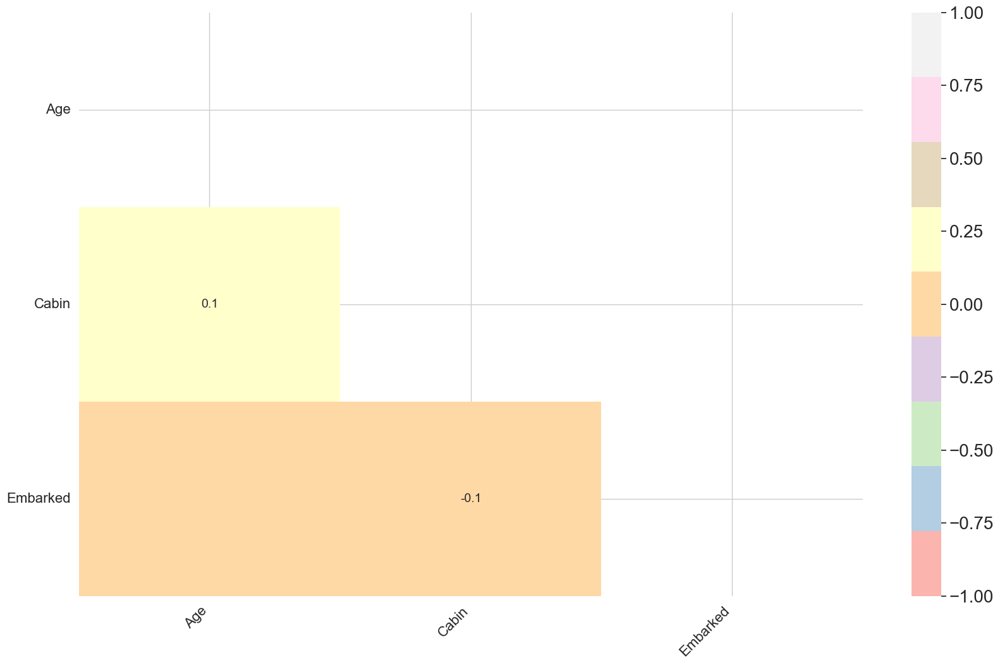

In [14]:
displayMissingDataHeatmap(train)

<Axes: >

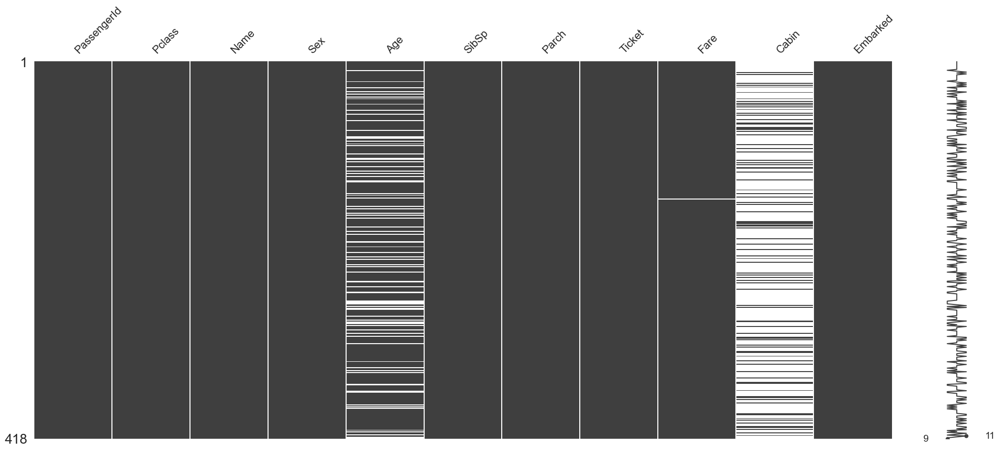

In [15]:
# Visualizing Missing Values 
missingno.matrix(test)

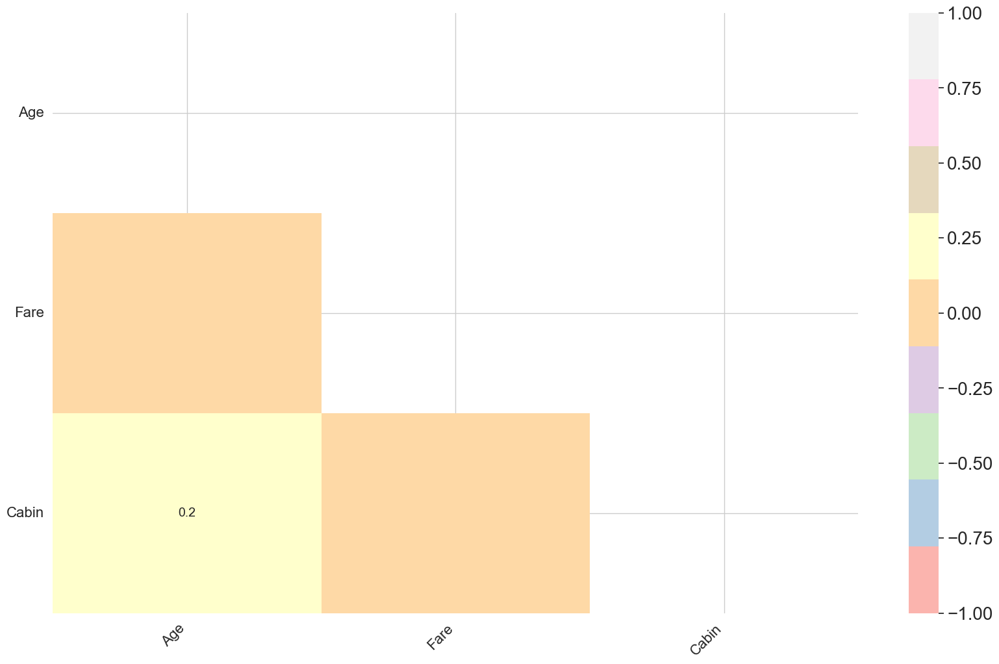

In [16]:
displayMissingDataHeatmap(test)

# Dataset Preprocessing

In [17]:
# Visualizes the features in the dataset that have a high percentage of NaN values as a horizontal bar plot.
def displayFeaturesWithHighNanValues(dataset):
    columnNan = dataset.isna().sum() / dataset.shape[0]
    pyplot.figure(figsize=(8, 5))
    seaborn.set(font_scale=1.2)
    columnNan[columnNan > 0.01].plot(kind="barh", color=seaborn.color_palette("Greys", len(columnNan[columnNan > 0.01])))
    pyplot.title("Top Features by NaN Percentage")
    pyplot.show()

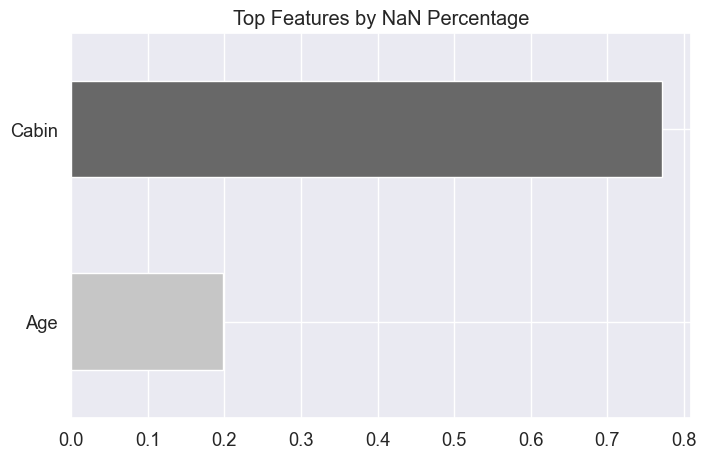

In [18]:
displayFeaturesWithHighNanValues(train)

***In the initial phase, we will eliminate the attributes PassengerId, Name, and Ticket, as they are not essential for the prediction process.***

In [19]:
# Remove 'PassengerId', 'Name', and 'Ticket' columns from the train dataset as they are not needed for the analysis
train.drop(['PassengerId', 'Name', 'Ticket'], axis=1, inplace=True)

In [20]:
train

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,0,3,male,22.0,1,0,7.2500,NaN,S
1,1,1,female,38.0,1,0,71.2833,C85,C
2,1,3,female,26.0,0,0,7.9250,NaN,S
3,1,1,female,35.0,1,0,53.1000,C123,S
4,0,3,male,35.0,0,0,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,NaN,S
887,1,1,female,19.0,0,0,30.0000,B42,S
888,0,3,female,NaN,1,2,23.4500,NaN,S
889,1,1,male,26.0,0,0,30.0000,C148,C


In [21]:
# Remove 'PassengerId', 'Name', and 'Ticket' columns from the test dataset as they are not needed for the analysis
test.drop(['PassengerId', 'Name', 'Ticket'], axis=1, inplace=True)

In [22]:
test

,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,3,male,34.5,0,0,7.8292,NaN,Q
1,3,female,47.0,1,0,7.0000,NaN,S
2,2,male,62.0,0,0,9.6875,NaN,Q
3,3,male,27.0,0,0,8.6625,NaN,S
4,3,female,22.0,1,1,12.2875,NaN,S
...,...,...,...,...,...,...,...,...
413,3,male,NaN,0,0,8.0500,NaN,S
414,1,female,39.0,0,0,108.9000,C105,C
415,3,male,38.5,0,0,7.2500,NaN,S
416,3,male,NaN,0,0,8.0500,NaN,S


# Train Dataset Preprocessing

In [23]:
# Check if there is missing data in train dataset
countMissing(train)

Survived: 0
Pclass: 0
Sex: 0
Age: 177
SibSp: 0
Parch: 0
Fare: 0
Cabin: 687
Embarked: 2


***Only three columns in the train dataset contain missing values, which are addressed by replacing 'Age' with its median and 'Cabin' and 'Embarked' with randomly selected existing entries to preserve data integrity.***

In [24]:
# Completion of missing values in train dataset
replaceMissingWithMedian(train, 'Age')
replaceMissingWithRandom(train, 'Cabin')
replaceMissingWithRandom(train, 'Embarked')

In [25]:
train

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,0,3,male,22.0,1,0,7.2500,D20,S
1,1,1,female,38.0,1,0,71.2833,C85,C
2,1,3,female,26.0,0,0,7.9250,D20,S
3,1,1,female,35.0,1,0,53.1000,C123,S
4,0,3,male,35.0,0,0,8.0500,D20,S
...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,D20,S
887,1,1,female,19.0,0,0,30.0000,B42,S
888,0,3,female,28.0,1,2,23.4500,D20,S
889,1,1,male,26.0,0,0,30.0000,C148,C


In [26]:
# Verify if all missing values in the train dataset have been filled
countMissing(train)

Survived: 0
Pclass: 0
Sex: 0
Age: 0
SibSp: 0
Parch: 0
Fare: 0
Cabin: 0
Embarked: 0


# Implementing Encodings for Categorical Variables in the Training Dataset

***The categorical variables 'Cabin', 'Embarked', and 'Sex' are transformed into numerical form. This transformation is necessary because many machine learning algorithms can only handle numerical input. Label encoding is used for 'Cabin' and 'Embarked', while one-hot encoding is applied to 'Sex' to avoid introducing arbitrary orderings in the data.***

In [27]:
def preprocessTrain(data):
    labelEncoder = sklearn.preprocessing.LabelEncoder()
    data['Cabin'] = labelEncoder.fit_transform(data['Cabin'])
    data['Embarked'] = labelEncoder.fit_transform(data['Embarked'])

    oneHotEncoder = OneHotEncoder(drop='first')
    sexData = data[['Sex']]
    sexDataEncoded = oneHotEncoder.fit_transform(sexData).toarray()

    columns = oneHotEncoder.get_feature_names_out(input_features=['Sex'])

    sexDataEncoded = pandas.DataFrame(sexDataEncoded, columns=columns)
    data = data.drop(['Sex'], axis=1).join(sexDataEncoded)
    
    return data

In [28]:
train = preprocessTrain(train)

In [29]:
train

,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male
0,0,3,22.0,1,0,7.2500,96,2,1.0
1,1,1,38.0,1,0,71.2833,81,0,0.0
2,1,3,26.0,0,0,7.9250,96,2,0.0
3,1,1,35.0,1,0,53.1000,55,2,0.0
4,0,3,35.0,0,0,8.0500,96,2,1.0
...,...,...,...,...,...,...,...,...,...
886,0,2,27.0,0,0,13.0000,96,2,1.0
887,1,1,19.0,0,0,30.0000,30,2,0.0
888,0,3,28.0,1,2,23.4500,96,2,0.0
889,1,1,26.0,0,0,30.0000,60,0,1.0


# Test Dataset Preprocessing

In [30]:
# Verify if all missing values in the test dataset have been filled
countMissing(test)

Pclass: 0
Sex: 0
Age: 86
SibSp: 0
Parch: 0
Fare: 1
Cabin: 327
Embarked: 0


***Only three columns in the test dataset contain missing values, which are addressed by substituting 'Age' and 'Fare' with their median values and 'Cabin' with randomly selected existing entries to ensure data consistency.***

In [31]:
# Completion of missing values in test
replaceMissingWithMedian(test, 'Age')
replaceMissingWithMedian(test, 'Fare')
replaceMissingWithRandom(test, 'Cabin')

In [32]:
test

,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,3,male,34.5,0,0,7.8292,C85,Q
1,3,female,47.0,1,0,7.0000,C85,S
2,2,male,62.0,0,0,9.6875,C85,Q
3,3,male,27.0,0,0,8.6625,C85,S
4,3,female,22.0,1,1,12.2875,C85,S
...,...,...,...,...,...,...,...,...
413,3,male,27.0,0,0,8.0500,C85,S
414,1,female,39.0,0,0,108.9000,C105,C
415,3,male,38.5,0,0,7.2500,C85,S
416,3,male,27.0,0,0,8.0500,C85,S


In [33]:
# Validate if all missing values in the test dataset have been completed
countMissing(test)

Pclass: 0
Sex: 0
Age: 0
SibSp: 0
Parch: 0
Fare: 0
Cabin: 0
Embarked: 0


# Implementing Encodings for Categorical Variables in the Test Dataset

***The categorical variables 'Cabin', 'Embarked', and 'Sex' in the test dataset are converted into numerical form. This conversion ensures compatibility with our machine learning algorithms. Label encoding is used for 'Cabin' and 'Embarked', while one-hot encoding is applied to 'Sex' to prevent introducing arbitrary orderings in the data.***

In [34]:
def preprocessTest(data):
    labelEncoder = sklearn.preprocessing.LabelEncoder()
    data['Cabin'] = labelEncoder.fit_transform(data['Cabin'])
    data['Embarked'] = labelEncoder.fit_transform(data['Embarked'])

    oneHotEncoder = OneHotEncoder(drop='first')
    sexData = data[['Sex']]
    sexDataEncoded = oneHotEncoder.fit_transform(sexData).toarray()

    columns = oneHotEncoder.get_feature_names_out(input_features=['Sex'])

    sexDataEncoded = pandas.DataFrame(sexDataEncoded, columns=columns)
    data = data.drop(['Sex'], axis=1).join(sexDataEncoded)
    
    return data

In [35]:
test = preprocessTest(test)

In [36]:
test

,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male
0,3,34.5,0,0,7.8292,43,1,1.0
1,3,47.0,1,0,7.0000,43,2,0.0
2,2,62.0,0,0,9.6875,43,1,1.0
3,3,27.0,0,0,8.6625,43,2,1.0
4,3,22.0,1,1,12.2875,43,2,0.0
...,...,...,...,...,...,...,...,...
413,3,27.0,0,0,8.0500,43,2,1.0
414,1,39.0,0,0,108.9000,22,0,0.0
415,3,38.5,0,0,7.2500,43,2,1.0
416,3,27.0,0,0,8.0500,43,2,1.0


***Having addressed and filled all missing values in the dataset, we can now proceed to examine the correlation between the features and the target variable, SalePrice.***

# Features Engineering

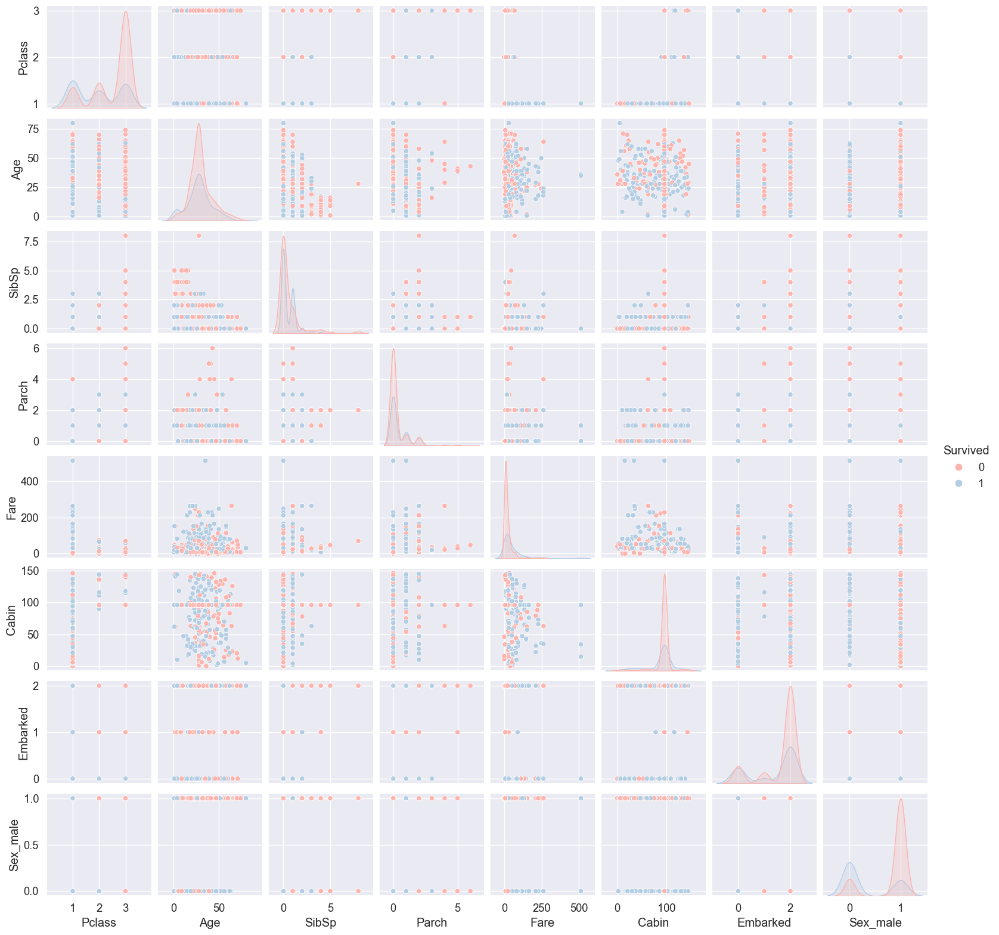

In [37]:
# Show pairplot of the features
seaborn.pairplot(data=train, hue='Survived', palette='Pastel1', height=2)

***The analysis of the Pclass variable reveals a significant correlation between passenger class and survival rates, with a majority of first-class passengers surviving. This suggests that the higher the class ranking, the greater the likelihood of survival. Furthermore, the data indicates that the age group with the highest survival rate falls between 20 to 40 years old.***

# In-Depth Visualization of Features and Target Relationships

***In this section, we generate a series of scatter plots to visualize the relationship between each feature in the dataset and the target column, 'Survived'. Each plot includes a regression line to highlight the trend. Additionally, we generate a heatmap to visualize the absolute correlations between different features in the dataset. These visualizations can provide valuable insights into the relationships and dependencies between variables, which can be crucial for feature selection and model optimization.***

In [38]:
# Function to generate a color map using seaborn
def generateColorMap(numberOfColors, name='muted'):
  return seaborn.color_palette(palette=name, n_colors=numberOfColors)

In [39]:
# Function to plot each feature in the dataset against the target column with a regression line
def plotFeaturesAgainstTarget(dataset, targetCol):
  numberOfRows = math.ceil(math.sqrt(len(dataset.columns)-1))
  numberOfColumns = math.ceil((len(dataset.columns)-1)/numberOfRows)
  figure, axes = pyplot.subplots(numberOfRows, numberOfColumns)
  pyplot.subplots_adjust(top=4.0, bottom=0, left=0, right=2.5)
  colors = generateColorMap(len(dataset.columns))

  for i in range(len(dataset.columns)):
    ax = seaborn.regplot(x=dataset.columns[i], y=targetCol, data=dataset, color=colors[i], ax=axes[i//numberOfRows, i%numberOfRows], scatter_kws={"s": 40})
    ax.set_title(label=f'{dataset.columns[i]} by {targetCol}', fontsize=10)


  for i in range(len(dataset.columns), numberOfRows*numberOfColumns):
    figure.delaxes(axes.flatten()[i])

In [40]:
# Visualizes the absolute correlation matrix of numeric columns in the dataset as a heatmap.
def displayCorrelationHeatmap(dataset):
    numericDataframe = dataset.select_dtypes(include=[numpy.number])
    pyplot.figure(figsize=(24, 20))
    correlationMatrix = abs(numericDataframe.corr())
    
    seaborn.heatmap(correlationMatrix, annot=True, cmap="Pastel1", vmin=0, vmax=1, annot_kws={"size": 12})
    
    pyplot.tight_layout() 
    pyplot.show()
    return correlationMatrix

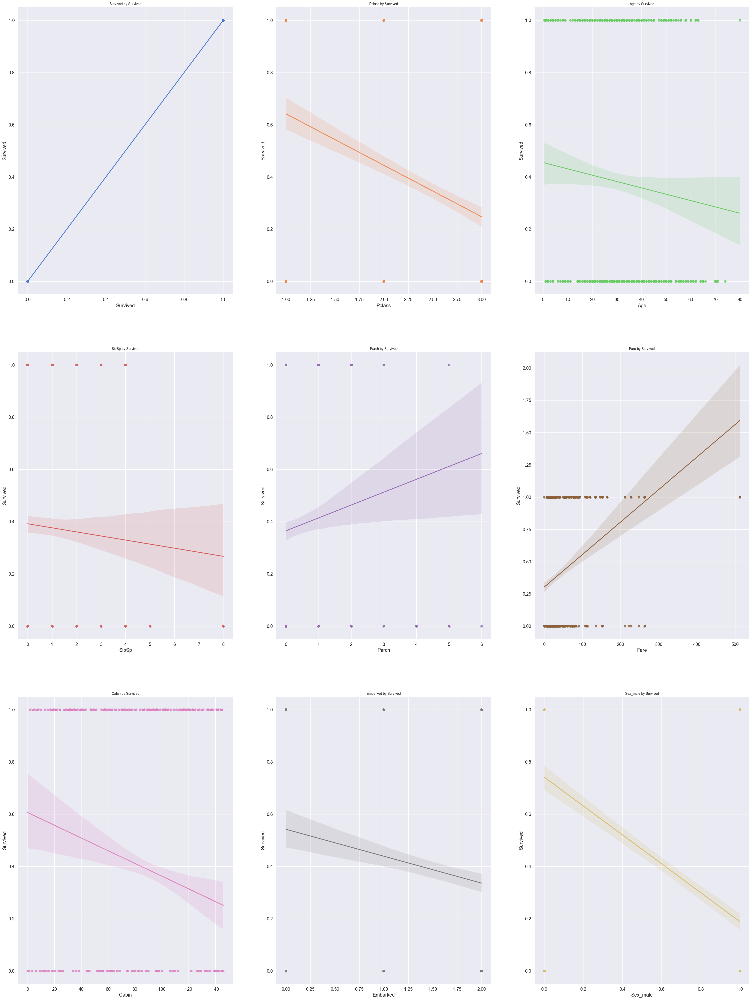

In [41]:
plotFeaturesAgainstTarget(train, 'Survived')

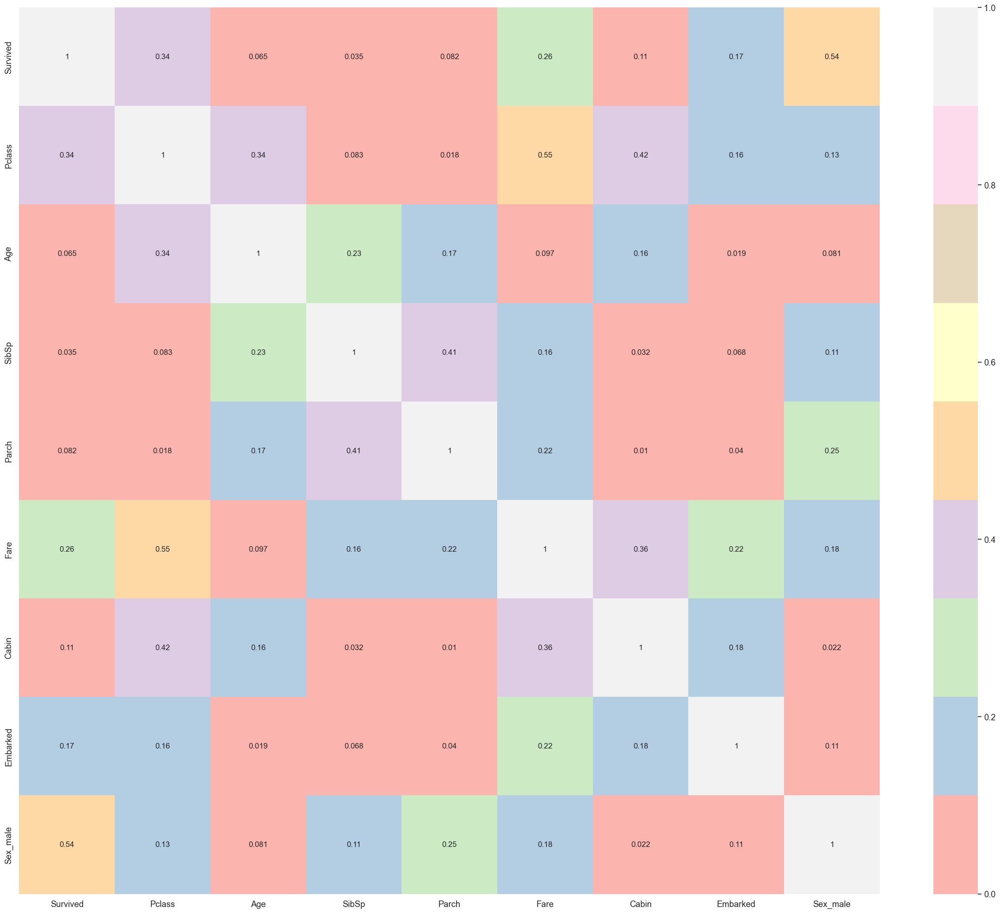

,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male
Survived,1.000000,0.338481,0.064910,0.035322,0.081629,0.257307,0.109255,0.167675,0.543351
Pclass,0.338481,1.000000,0.339898,0.083081,0.018443,0.549500,0.415934,0.162098,0.131900
Age,0.064910,0.339898,1.000000,0.233296,0.172482,0.096688,0.161249,0.018754,0.081163
SibSp,0.035322,0.083081,0.233296,1.000000,0.414838,0.159651,0.032167,0.068230,0.114631
Parch,0.081629,0.018443,0.172482,0.414838,1.000000,0.216225,0.010404,0.039798,0.245489
Fare,0.257307,0.549500,0.096688,0.159651,0.216225,1.000000,0.356812,0.224719,0.182333
Cabin,0.109255,0.415934,0.161249,0.032167,0.010404,0.356812,1.000000,0.176685,0.021638
Embarked,0.167675,0.162098,0.018754,0.068230,0.039798,0.224719,0.176685,1.000000,0.108262
Sex_male,0.543351,0.131900,0.081163,0.114631,0.245489,0.182333,0.021638,0.108262,1.000000


In [42]:
# Display a heatmap to visualize the absolute correlation between different features in the 'train' dataset
displayCorrelationHeatmap(train)

# Introducing a New Feature: IsAlone

***We will introduce a new feature named IsAlone to determine if a passenger is traveling alone. This feature will be set to 1 if the sum of SibSp (number of siblings or spouses aboard) and Parch (number of parents or children aboard) equals 0, indicating the passenger is alone. Conversely, if this sum is greater than 0, indicating the presence of family members aboard, IsAlone will be set to 0.***

In [43]:
def createIsAloneFeatureCopy(dataset):
    datasetCopy = dataset.copy()
    datasetCopy.insert(len(dataset.columns), 'IsAlone', 0)
    datasetCopy.loc[datasetCopy['SibSp'] + datasetCopy['Parch'] == 0, 'IsAlone'] = 1
    return datasetCopy

In [44]:
trainCopy = createIsAloneFeatureCopy(train)
testCopy = createIsAloneFeatureCopy(test)

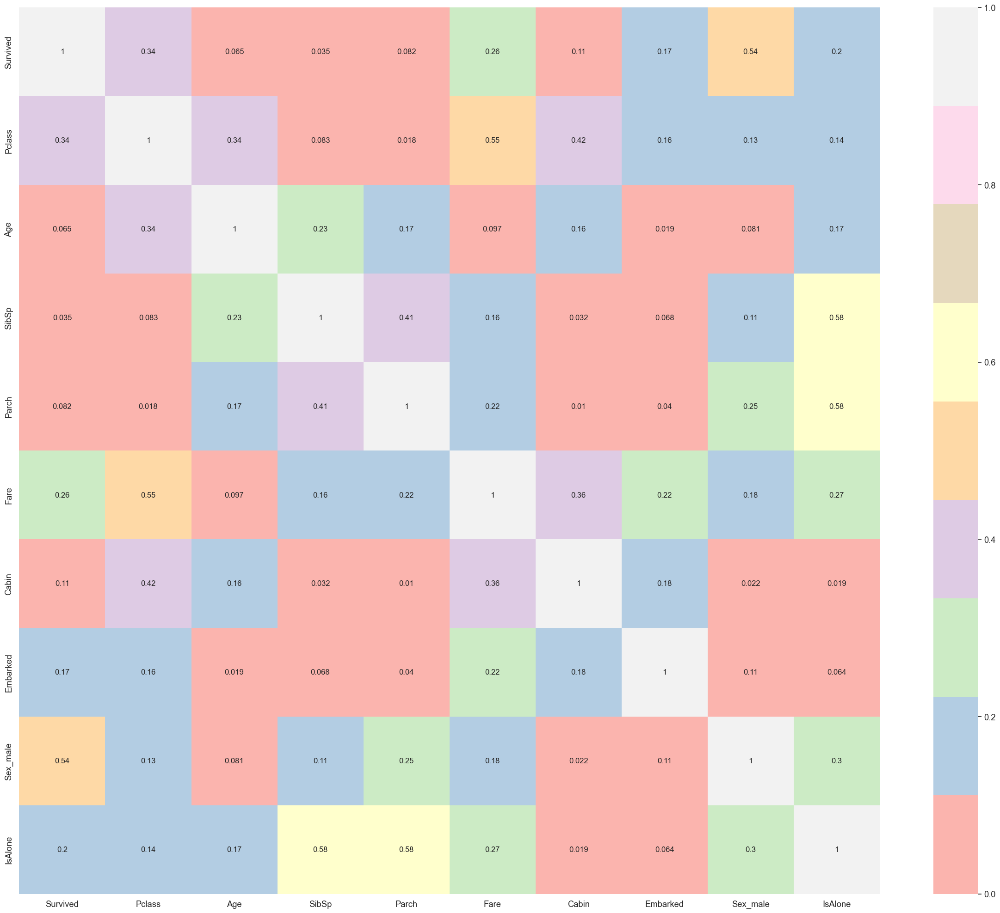

,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male,IsAlone
Survived,1.000000,0.338481,0.064910,0.035322,0.081629,0.257307,0.109255,0.167675,0.543351,0.203367
Pclass,0.338481,1.000000,0.339898,0.083081,0.018443,0.549500,0.415934,0.162098,0.131900,0.135207
Age,0.064910,0.339898,1.000000,0.233296,0.172482,0.096688,0.161249,0.018754,0.081163,0.171647
SibSp,0.035322,0.083081,0.233296,1.000000,0.414838,0.159651,0.032167,0.068230,0.114631,0.584471
Parch,0.081629,0.018443,0.172482,0.414838,1.000000,0.216225,0.010404,0.039798,0.245489,0.583398
Fare,0.257307,0.549500,0.096688,0.159651,0.216225,1.000000,0.356812,0.224719,0.182333,0.271832
Cabin,0.109255,0.415934,0.161249,0.032167,0.010404,0.356812,1.000000,0.176685,0.021638,0.019322
Embarked,0.167675,0.162098,0.018754,0.068230,0.039798,0.224719,0.176685,1.000000,0.108262,0.063532
Sex_male,0.543351,0.131900,0.081163,0.114631,0.245489,0.182333,0.021638,0.108262,1.000000,0.303646
IsAlone,0.203367,0.135207,0.171647,0.584471,0.583398,0.271832,0.019322,0.063532,0.303646,1.000000


In [45]:
# Display a heatmap to visualize the absolute correlation between different features, including the new 'FarePerPclass' feature, in the copied 'train' dataset
displayCorrelationHeatmap(trainCopy)

# Performance Evaluation and Data Slicing for Stochastic Gradient Descent and Multi-Layer Perceptron Models

In [46]:
# Function to print four graphs: Cross-Entropy (CE) of train/test and R-squared (R2) of train/test
def displayGraph(graph):
  for metricKey, metricData in graph.items():
    optimalValue = max(metricData.values()) if 'R2' in metricKey else min(metricData.values())
    optimalIndex = numpy.argmax(list(metricData.values())) if 'R2' in metricKey else numpy.argmin(list(metricData.values()))
    color = 'r' if 'train' in metricKey else 'b'
    pyplot.rcParams["figure.figsize"] = (16, 8)
    pyplot.plot(list(metricData.keys()), list(metricData.values()), color)
    pyplot.grid()
    pyplot.xlabel('X')
    pyplot.ylabel('Y')
    pyplot.title(f'{metricKey}, best value: x={optimalIndex + 1}, y={optimalValue}', fontsize=20)
    pyplot.show()

In [47]:
# Function to plot the score and loss by split for Stochastic Gradient Descent (SGD)
def plotSGDScoreAndLossBySplit(features, targets):
  graph = { 'TrainingLoss': {}, 'ValidationLoss': {}, 'TrainingScore': {}, 'ValidationScore': {} }

  for splitSize in range(10, 100, 10):
    featuresTraining, featuresValidation, targetsTraining, targetsValidation = model_selection.train_test_split(features, targets, test_size=splitSize/100, random_state=42)
    SGDClassifierPipeline = pipeline.make_pipeline(preprocessing.StandardScaler(), linear_model.SGDClassifier(loss='log_loss', alpha=0, learning_rate='constant', eta0=0.01)).fit(featuresTraining, targetsTraining)
    trainingProbabilities = SGDClassifierPipeline.predict_proba(featuresTraining)
    validationProbabilities = SGDClassifierPipeline.predict_proba(featuresValidation)
    trainingPredictions = SGDClassifierPipeline.predict(featuresTraining)
    validationPredictions = SGDClassifierPipeline.predict(featuresValidation)
    graph['TrainingLoss'][splitSize/100] = metrics.log_loss(targetsTraining, trainingProbabilities)
    graph['ValidationLoss'][splitSize/100] = metrics.log_loss(targetsValidation, validationProbabilities)
    graph['TrainingScore'][splitSize/100] = SGDClassifierPipeline.score(featuresTraining, targetsTraining)
    graph['ValidationScore'][splitSize/100] = SGDClassifierPipeline.score(featuresValidation, targetsValidation)
  displayGraph(graph)

In [48]:
# Function to plot the score and loss by split for Multi-Layer Perceptron (MLP)
def plotMLPScoreAndLossBySplit(features, targets):
  graph = { 'TrainingLoss': {}, 'ValidationLoss': {}, 'TrainingScore': {}, 'ValidationScore': {} }

  for splitSize in range(10, 100, 10):
    featuresTraining, featuresValidation, targetsTraining, targetsValidation = model_selection.train_test_split(features, targets, test_size=splitSize/100, random_state=42)
    MLPClassifier = neural_network.MLPClassifier(activation='logistic', solver='sgd', alpha=0, max_iter=40000).fit(featuresTraining, targetsTraining)
    trainingProbabilities = MLPClassifier.predict_proba(featuresTraining)
    validationProbabilities = MLPClassifier.predict_proba(featuresValidation)
    graph['TrainingLoss'][splitSize/100] = metrics.log_loss(targetsTraining, trainingProbabilities)
    graph['ValidationLoss'][splitSize/100] = metrics.log_loss(targetsValidation, validationProbabilities)
    graph['TrainingScore'][splitSize/100] = MLPClassifier.score(featuresTraining, targetsTraining)
    graph['ValidationScore'][splitSize/100] = MLPClassifier.score(featuresValidation, targetsValidation)
  displayGraph(graph)

# Preparing the Standard Training Dataset

In [49]:
def splitDataset(train):
    target = train['Survived'].copy()
    feature = train.drop(['Survived'], axis=1)

    display(target)
    display(feature)
    
    return target, feature

In [50]:
target, feature = splitDataset(train)

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male
0,3,22.0,1,0,7.2500,96,2,1.0
1,1,38.0,1,0,71.2833,81,0,0.0
2,3,26.0,0,0,7.9250,96,2,0.0
3,1,35.0,1,0,53.1000,55,2,0.0
4,3,35.0,0,0,8.0500,96,2,1.0
...,...,...,...,...,...,...,...,...
886,2,27.0,0,0,13.0000,96,2,1.0
887,1,19.0,0,0,30.0000,30,2,0.0
888,3,28.0,1,2,23.4500,96,2,0.0
889,1,26.0,0,0,30.0000,60,0,1.0


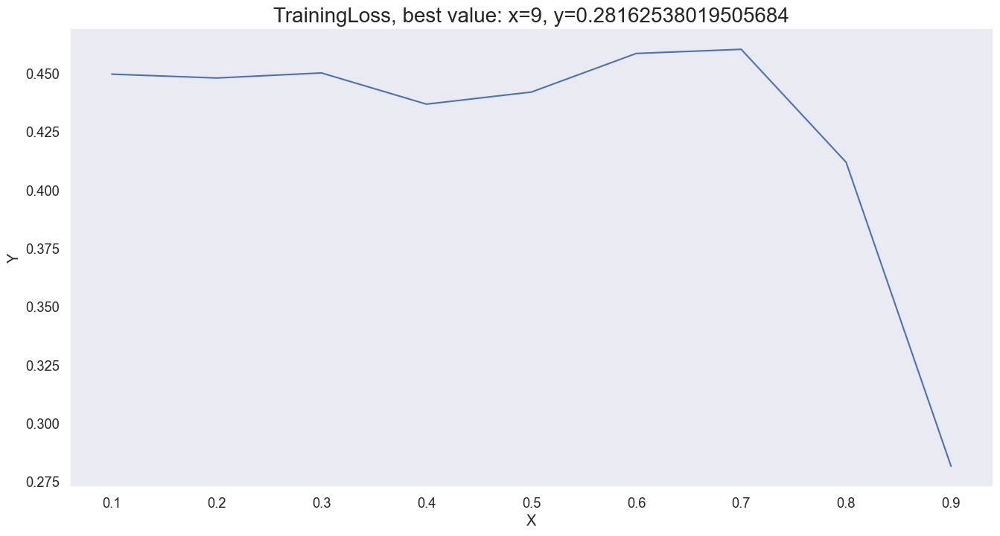

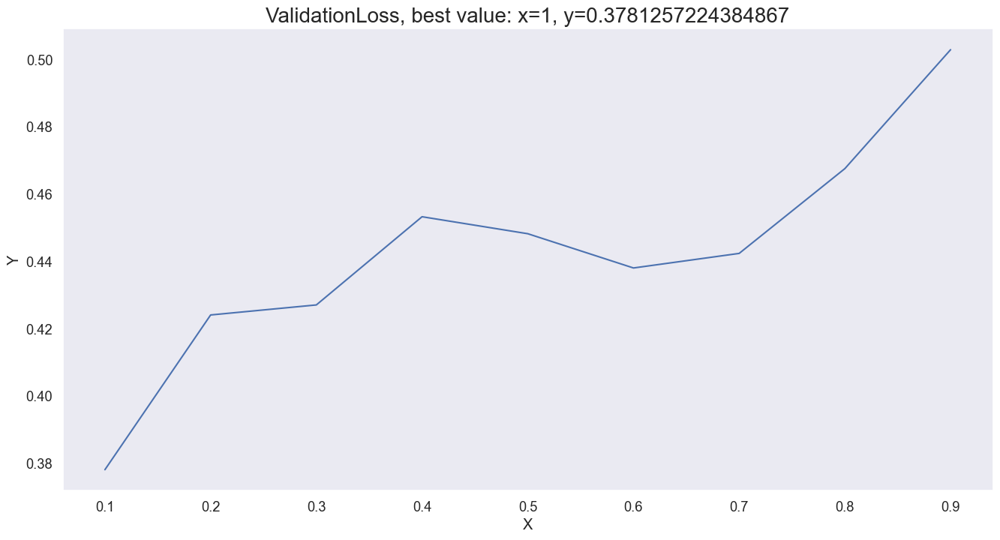

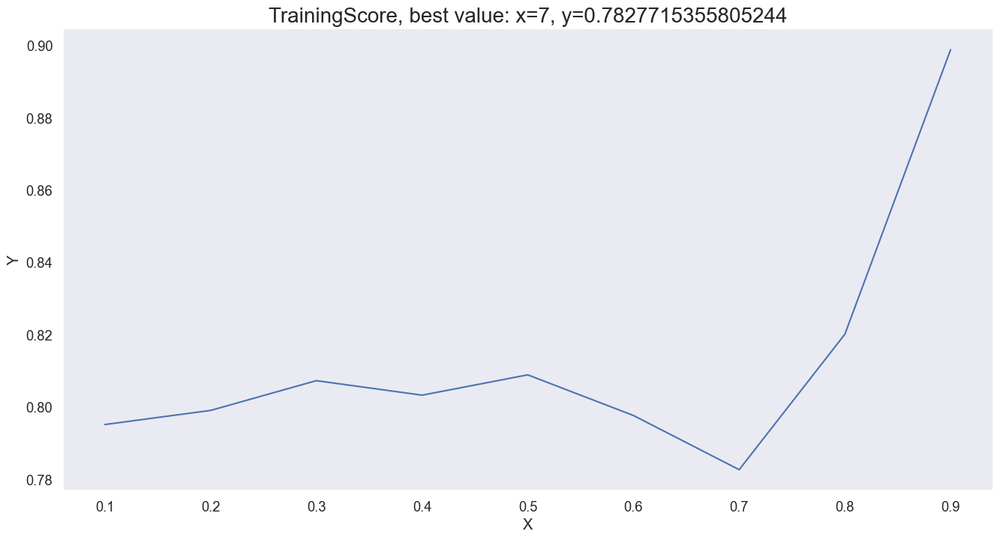

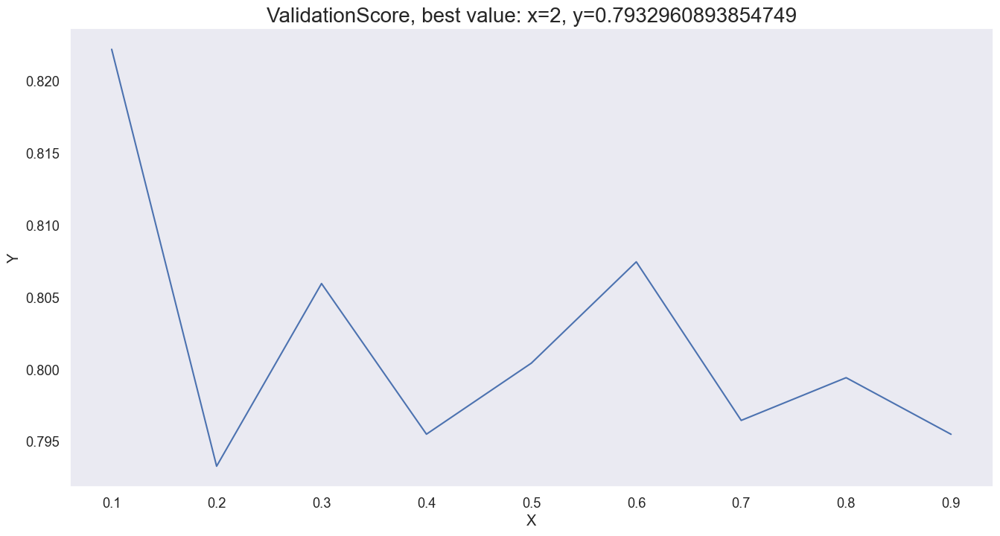

In [51]:
# plot the train on SGD model be different slicing of the dataset
plotSGDScoreAndLossBySplit(feature, target)

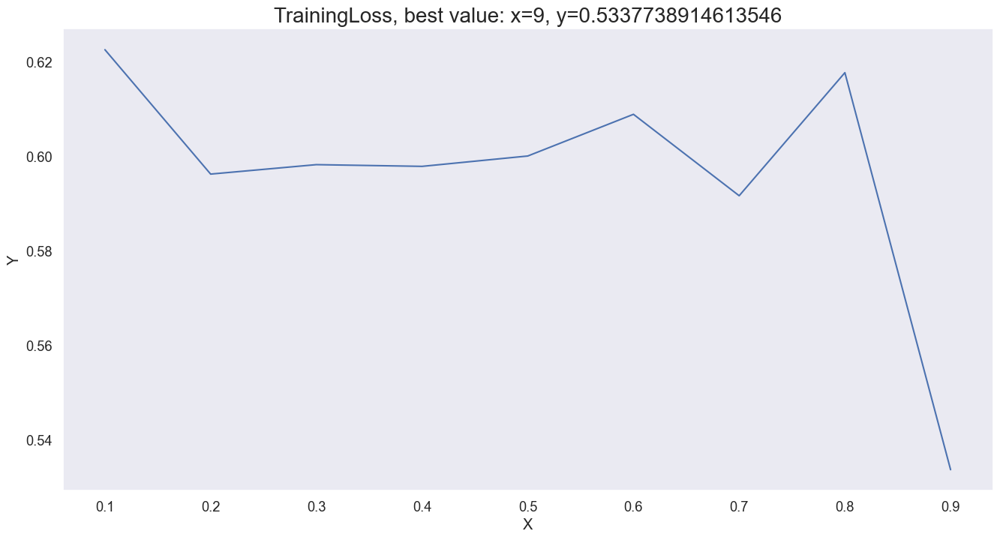

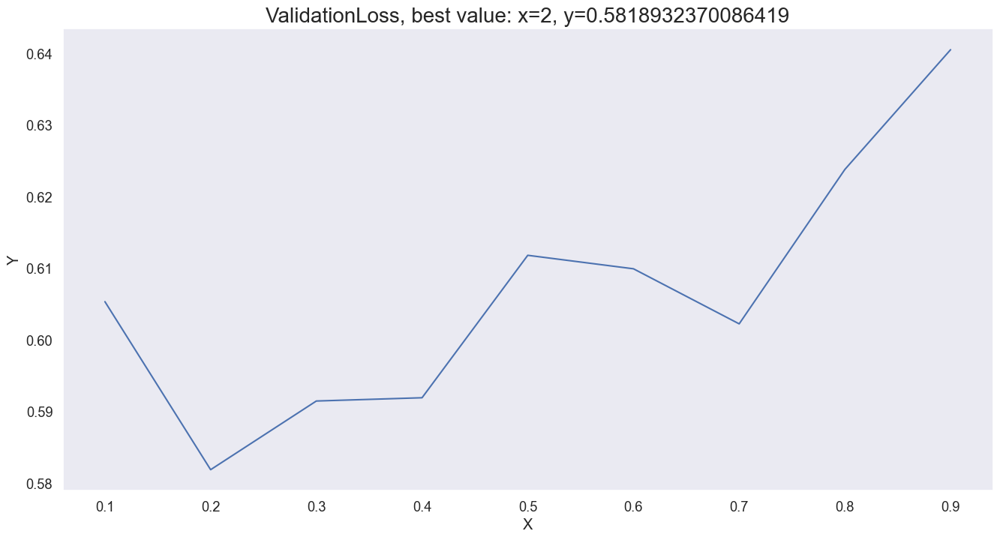

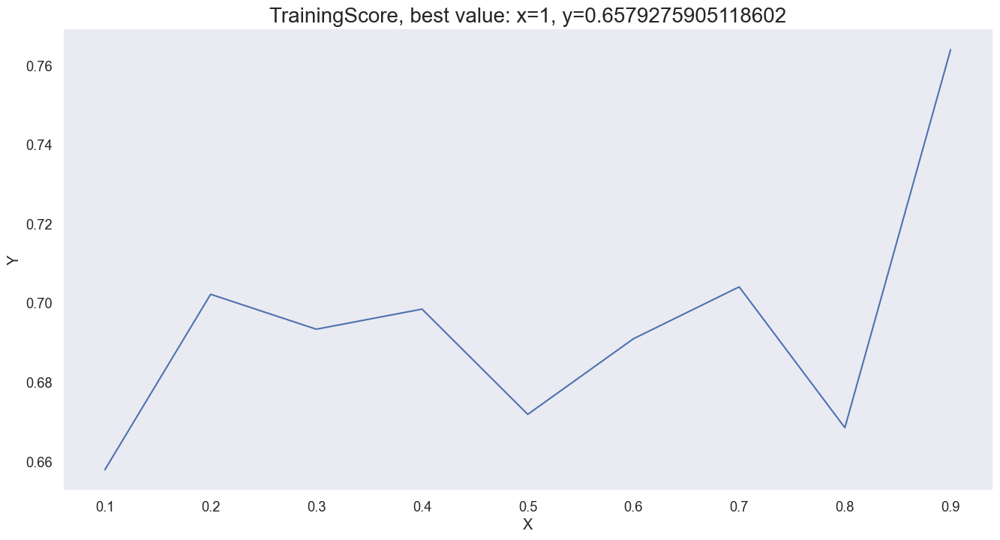

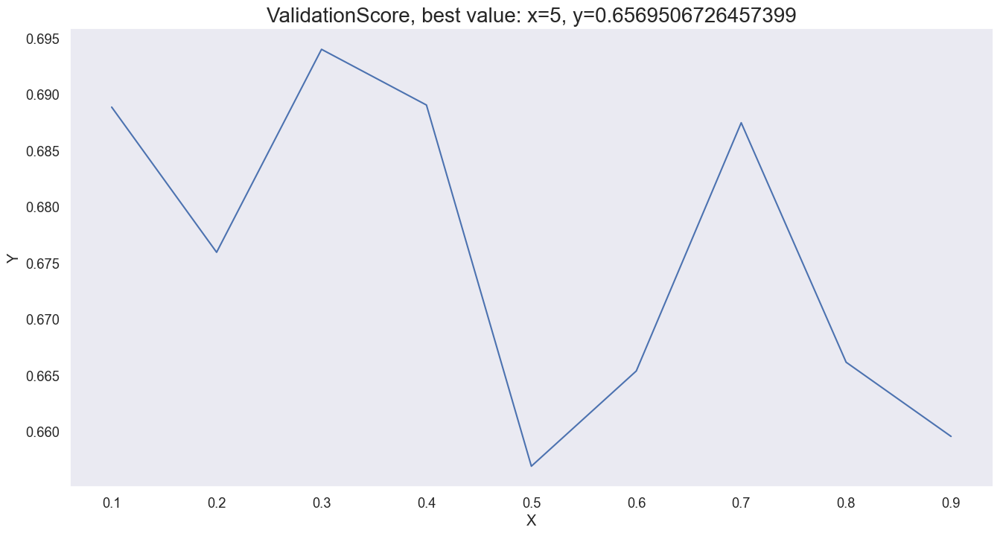

In [52]:
# plot the train on MLP model be different slicing of the dataset
plotMLPScoreAndLossBySplit(feature, target)

# Preparing the Enhanced Training Dataset with 'IsAlone' Feature

In [53]:
def splitCopyDataset(trainCopy):
    targetCopy = trainCopy['Survived'].copy()
    featureCopy = trainCopy.drop(['Survived'], axis=1)

    display(targetCopy)
    display(featureCopy)
    
    return targetCopy, featureCopy

In [54]:
targetCopy, featureCopy = splitCopyDataset(trainCopy)

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

,Pclass,Age,SibSp,Parch,Fare,Cabin,Embarked,Sex_male,IsAlone
0,3,22.0,1,0,7.2500,96,2,1.0,0
1,1,38.0,1,0,71.2833,81,0,0.0,0
2,3,26.0,0,0,7.9250,96,2,0.0,1
3,1,35.0,1,0,53.1000,55,2,0.0,0
4,3,35.0,0,0,8.0500,96,2,1.0,1
...,...,...,...,...,...,...,...,...,...
886,2,27.0,0,0,13.0000,96,2,1.0,1
887,1,19.0,0,0,30.0000,30,2,0.0,1
888,3,28.0,1,2,23.4500,96,2,0.0,0
889,1,26.0,0,0,30.0000,60,0,1.0,1


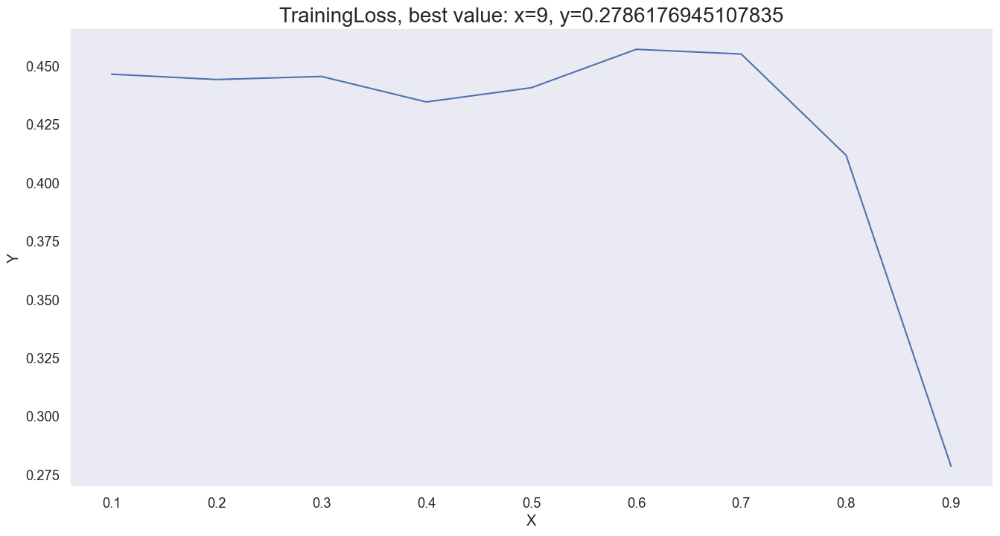

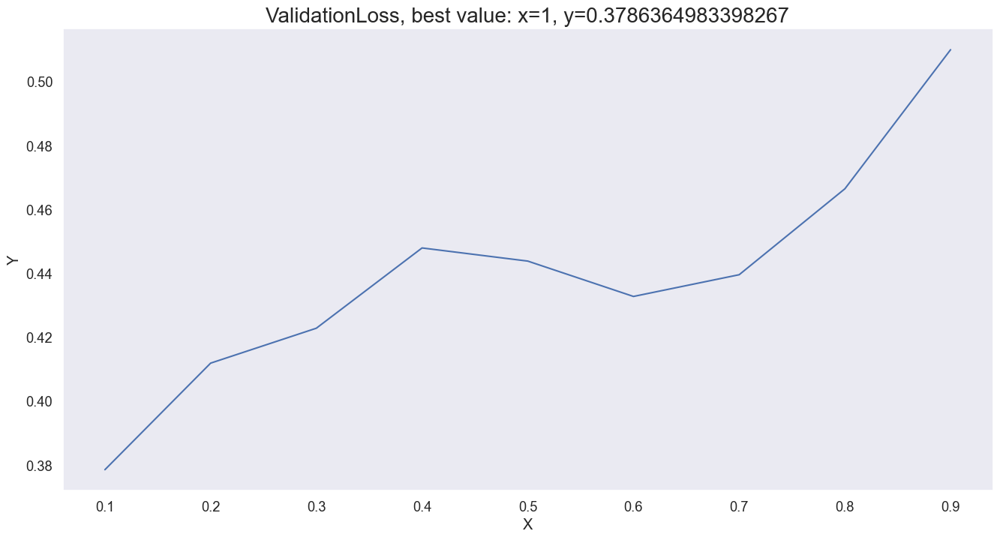

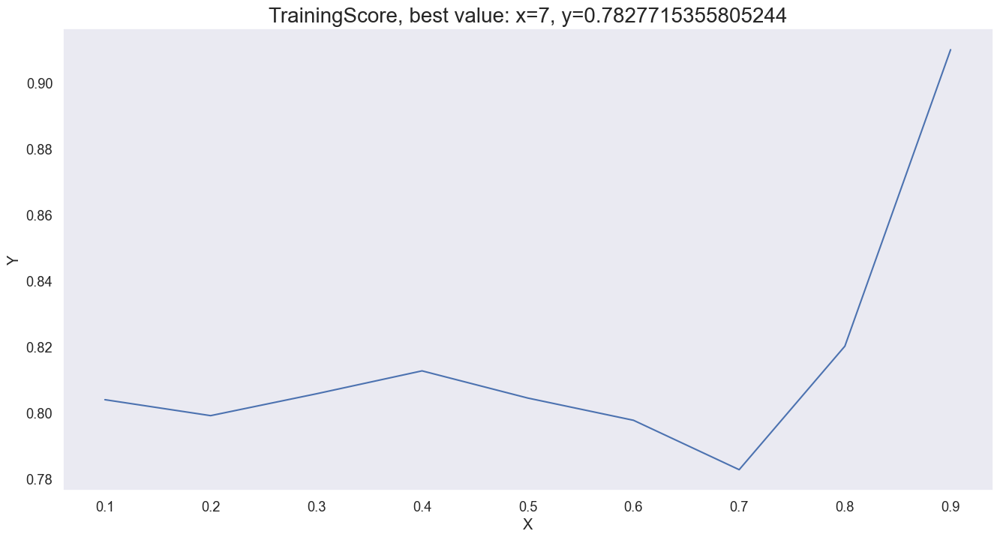

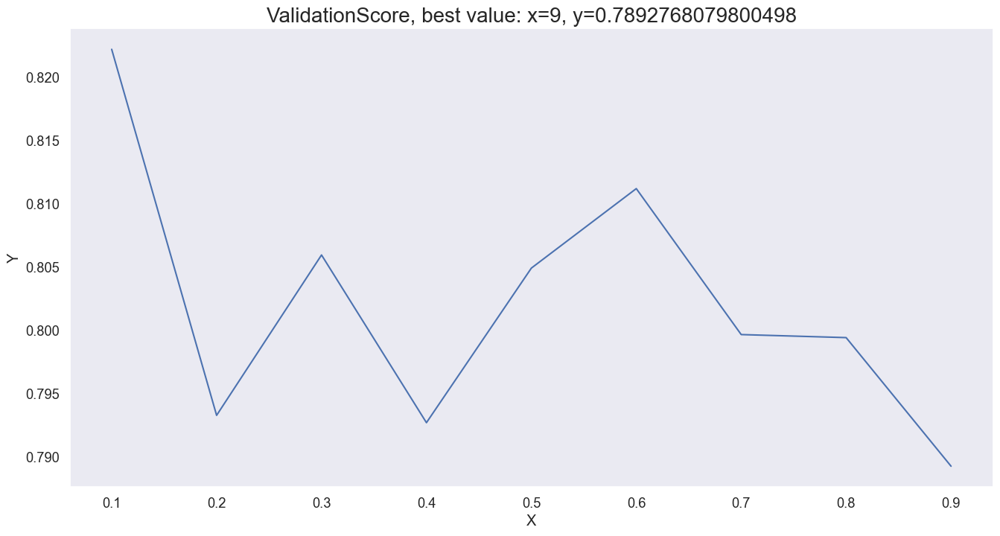

In [55]:
# plot the trainCopy on SGD model be different slicing of the dataset
plotSGDScoreAndLossBySplit(featureCopy, targetCopy)

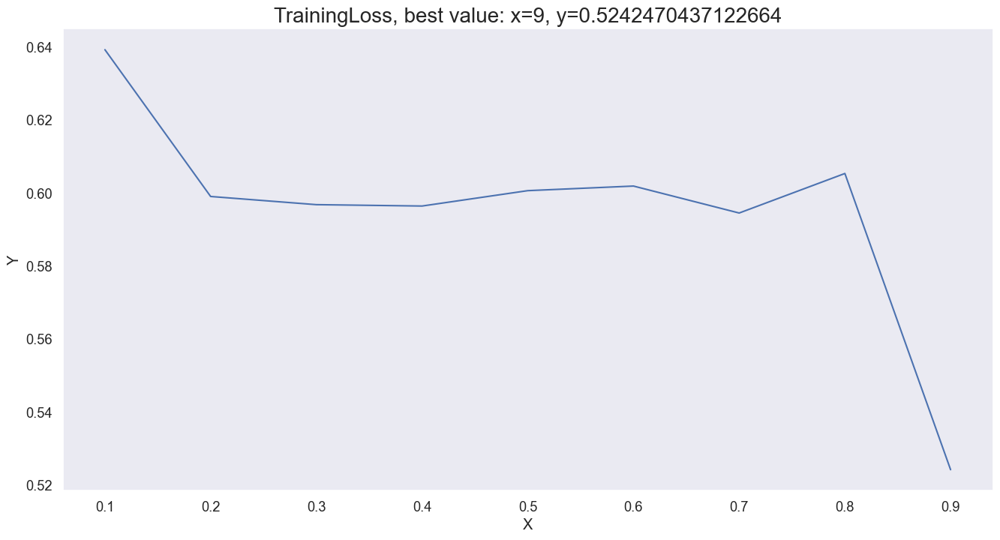

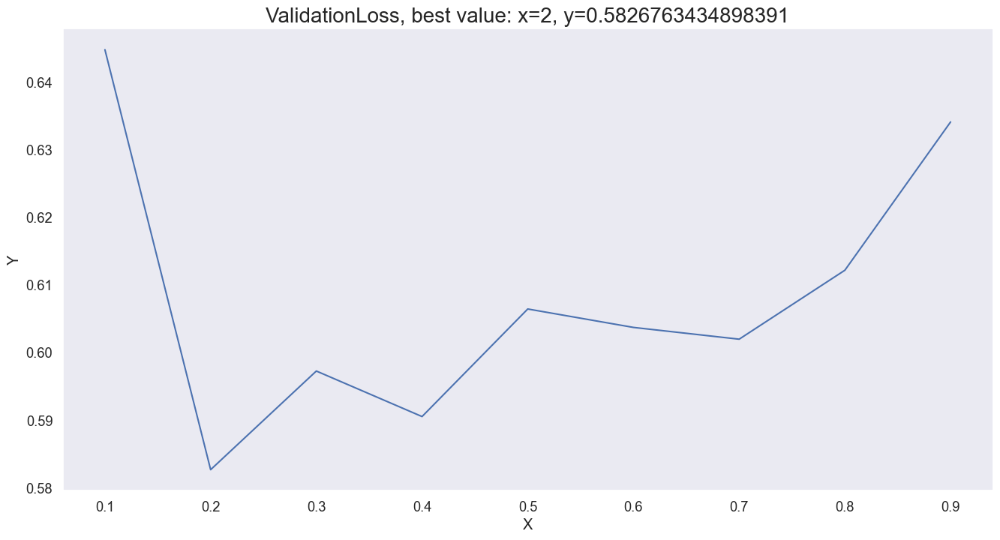

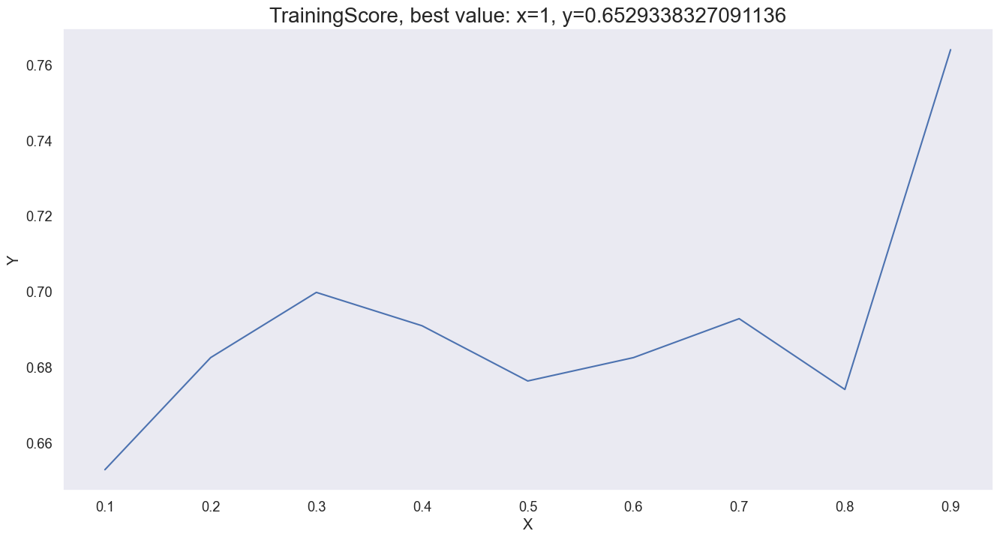

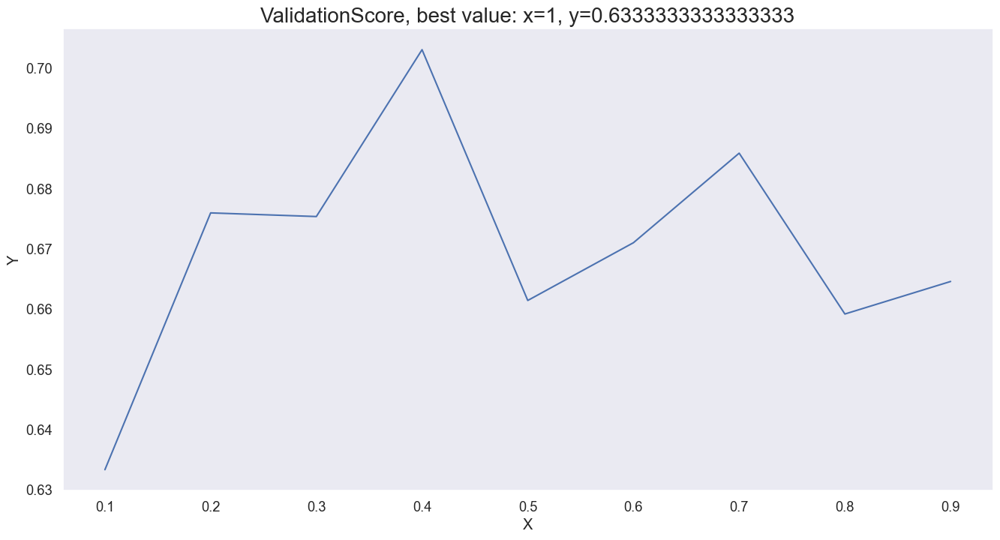

In [56]:
# plot the trainCopy on MLP model be different slicing of the dataset
plotMLPScoreAndLossBySplit(featureCopy, targetCopy)

# Classification

In [57]:
def evaluateSGDClassifier(featureCopy, target):
    # Split the training dataset into 75% for training and 25% for testing
    featuresTrain, featuresTest, targetTrain, targetTest = model_selection.train_test_split(featureCopy, target, test_size=0.25, random_state=42)
    
    # Create the Stochastic Gradient Descent (SGD) classifier and fit it to the training data
    SGDClassifierPipeline = pipeline.make_pipeline(
        preprocessing.StandardScaler(), 
        linear_model.SGDClassifier(loss='log_loss', alpha=0, learning_rate='constant', eta0=0.01)
    ).fit(featuresTrain, targetTrain)

    # Predict the probabilities for the training and testing data
    trainProbabilities = SGDClassifierPipeline.predict_proba(featuresTrain)
    testProbabilities = SGDClassifierPipeline.predict_proba(featuresTest)

    # Predict the classes for the training and testing data
    trainPredictions = SGDClassifierPipeline.predict(featuresTrain)
    testPredictions = SGDClassifierPipeline.predict(featuresTest)

    # Print the accuracy score for the training and testing data
    print('Accuracy score on training data:', SGDClassifierPipeline.score(featuresTrain, targetTrain))
    print('Accuracy score on testing data:', SGDClassifierPipeline.score(featuresTest, targetTest))

    # Print the Cross-Entropy (CE) loss for the training and testing data
    print('Cross-Entropy loss on training data:', metrics.log_loss(targetTrain, trainProbabilities))
    print('Cross-Entropy loss on testing data:', metrics.log_loss(targetTest, testProbabilities))
    
    return featuresTrain, featuresTest, targetTrain, targetTest, SGDClassifierPipeline

In [58]:
featuresTrain, featuresTest, targetTrain, targetTest, SGDClassifierPipeline = evaluateSGDClassifier(featureCopy, target)

Accuracy score on training data: 0.8023952095808383
Accuracy score on testing data: 0.7982062780269058
Cross-Entropy loss on training data: 0.44476824363749146
Cross-Entropy loss on testing data: 0.41951838410654846


In [59]:
# Create the Stochastic Gradient Descent (SGD) classifier and fit it to the entire dataset
SGDClassifierPipeline = pipeline.make_pipeline(preprocessing.StandardScaler(), linear_model.SGDClassifier(loss='log_loss', alpha=0, learning_rate='constant', eta0=0.01)).fit(featureCopy, target)

# Predict the classes for the test data
submissionPredictions = SGDClassifierPipeline.predict(testCopy)

# Preparing the Submission CSV File

In [60]:
def export(submissionPassengerId, submissionPredictions):
    # Create the submission file
    submission = pandas.DataFrame({
        'PassengerId': submissionPassengerId,
        'Survived': submissionPredictions
    })
    submission.to_csv('Repository/submission.csv', index=False)
    display(submission)

In [61]:
export(submissionPassengerId, submissionPredictions)

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
...,...,...
413,1305,0
414,1306,1
415,1307,0
416,1308,0


# Submissions

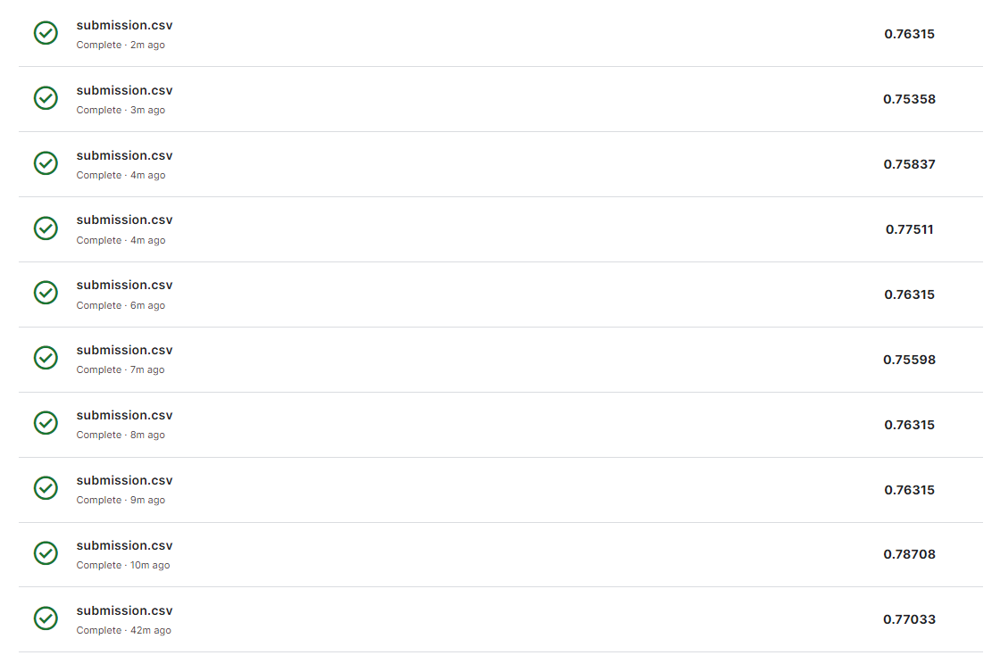

# Leaderboard

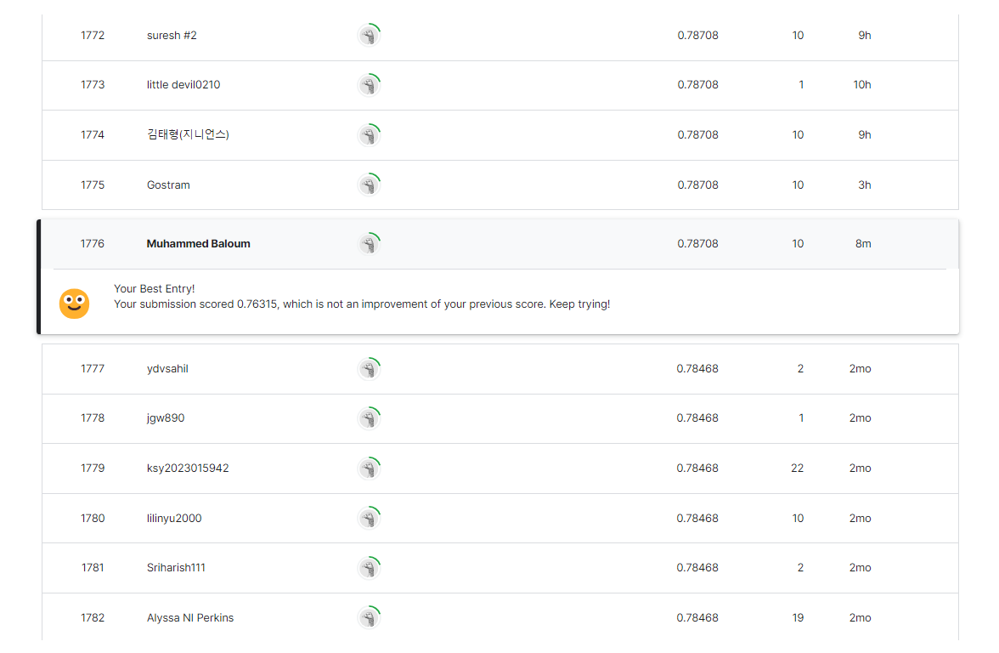

# Model Performance Analysis

***Following extensive research and data analysis, several experiments were conducted on two distinct data types using two models: SGDClassifier and MLP. In each experiment, the data was partitioned differently into training and validation sets to determine the optimal split for the models. The experiments revealed that the most effective approach is to use the copied data (including the IsAlone feature) with a 75% training and 25% validation split for the SGDClassifier model.***

# References

***Scikit-learn Library Documentation***: Detailed information about the Scikit-learn library, its modules, classes, and functions can be found in the official documentation.
https://scikit-learn.org/stable/

***Reading the Dataset***: A comprehensive beginner's guide to reading and understanding the Titanic dataset, including how to make your first submission, is available on Kaggle.
https://www.kaggle.com/jlawman/complete-beginner-your-first-titanic-submission

***Advanced Feature Engineering Tutorial***: This detailed Kaggle notebook provides an in-depth tutorial on advanced feature engineering techniques, which can be particularly useful for improving the performance of machine learning models. https://www.kaggle.com/gunesevitan/titanic-advanced-feature-engineering-tutorial

---

# Advanced Stage

---

In [62]:
# Calculates the length of a generator, with an option to display a progress bar.
def calculateGeneratorLength(generator, useProgressBar=True):
    counter = 0
    
    if useProgressBar:
        progressBar = tqdm(desc='Calculating Length', ncols=1000, bar_format='{desc}{bar:10}{r_bar}')

    for _ in generator:
        counter += 1

        if useProgressBar:
            progressBar.update()

    if useProgressBar:
        progressBar.close()

    return counter

In [63]:
# Calculate the precision from the confusion matrix
def calculatePrecision(confusionMatrix):
    trueNegative, falsePositive, falseNegative, truePositive = confusionMatrix.ravel()
    return truePositive / (truePositive + falsePositive)

# Calculate the recall from the confusion matrix
def calculateRecall(confusionMatrix):
    trueNegative, falsePositive, falseNegative, truePositive = confusionMatrix.ravel()
    return truePositive / (truePositive + falseNegative)

# Calculate the specificity from the confusion matrix
def calculateSpecificity(confusionMatrix):
    trueNegative, falsePositive, falseNegative, truePositive = confusionMatrix.ravel()
    return trueNegative / (trueNegative + falsePositive)

# Calculate the false positive rate from the confusion matrix
def calculateFalsePositiveRate(confusionMatrix):
    trueNegative, falsePositive, falseNegative, truePositive = confusionMatrix.ravel()
    return falsePositive / (falsePositive + trueNegative)

# Calculate the accuracy from the confusion matrix
def calculateAccuracy(confusionMatrix):
    trueNegative, falsePositive, falseNegative, truePositive = confusionMatrix.ravel()
    return (truePositive + trueNegative) / (truePositive + trueNegative + falsePositive + falseNegative)

# Calculate the F1 score from the confusion matrix
def calculateF1Score(confusionMatrix):
    precisionValue = calculatePrecision(confusionMatrix)
    recallValue = calculateRecall(confusionMatrix)
    return (2 * precisionValue * recallValue) / (precisionValue + recallValue)

# Calculate the balanced accuracy from the confusion matrix
def calculateBalancedAccuracy(confusionMatrix):
    recallValue = calculateRecall(confusionMatrix)
    specificityValue = calculateSpecificity(confusionMatrix)
    return (recallValue + specificityValue) / 2

# Calculate various metrics from the confusion matrix and return them as a dictionary
def calculateMetrics(confusionMatrix):
    return {
        'Precision': calculatePrecision(confusionMatrix),
        'Recall': calculateRecall(confusionMatrix),
        'Specificity': calculateSpecificity(confusionMatrix),
        'False Positive Rate': calculateFalsePositiveRate(confusionMatrix),
        'Accuracy': calculateAccuracy(confusionMatrix),
        'F1 Score': calculateF1Score(confusionMatrix),
        'Balanced Accuracy': calculateBalancedAccuracy(confusionMatrix),
    }

In [64]:
# print all metrics from confusion_matrix for train and validation
def displayConfusionMatrix(model, trainingConfusionMatrix, validationConfusionMatrix):
    trainingConfusionMatrixDataFrame = pandas.DataFrame(trainingConfusionMatrix, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])
    validationConfusionMatrixDataFrame = pandas.DataFrame(validationConfusionMatrix, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

    figure, axes = pyplot.subplots(ncols=2, figsize=(10, 3))
    for index, (dataFrame, title) in enumerate(zip([trainingConfusionMatrixDataFrame, validationConfusionMatrixDataFrame], ['Train', 'Validation'])):
        heatmap = seaborn.heatmap(dataFrame, annot=True, ax=axes[index], cmap='Pastel1', fmt='d')
        heatmap.set_title(title, fontsize=12)
        heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=12)
        heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=12)
        heatmap.set_ylabel('Actual Label', fontsize=12)
        heatmap.set_xlabel('Predicted Label', fontsize=12)
    pyplot.subplots_adjust(top=1.5, bottom=0, left=0, right=1, wspace=0.4, hspace=0.4)
    pyplot.show()

    display(pandas.DataFrame({'Train': calculateMetrics(trainingConfusionMatrix), 'Validation': calculateMetrics(validationConfusionMatrix)}))

In [65]:
def analyzeModelWithCrossValidation(features, targets, model, folds=None, parameter=None, displayGraphs=False, useProgressBar=True):
  scoresAndLossesDataFrame = pandas.DataFrame(columns=['foldIndex', 'splitType', 'score', 'loss'])

  if folds is not None:
    crossValidator = KFold(n_splits=folds, shuffle=True, random_state=2)
  elif parameter is not None:
    crossValidator = LeavePOut(parameter)
  else:
    raise ValueError("Must specify either `folds` or `parameter`.")

  if useProgressBar:
    progressBar = tqdm(desc='Computing Models', total=calculateGeneratorLength(crossValidator.split(features)))

  for index, (trainIndices, validationIndices) in enumerate(crossValidator.split(features)):
    featuresTrain = features.loc[trainIndices]
    targetsTrain = targets.loc[trainIndices]
    featuresValidation = features.loc[validationIndices]
    targetsValidation = targets.loc[validationIndices]

    model.fit(featuresTrain, targetsTrain)

    predictionsTrain = model.predict_proba(featuresTrain)
    predictionsValidation = model.predict_proba(featuresValidation)

    scoresAndLossesDataFrame.loc[len(scoresAndLossesDataFrame)] = [index, 'train', model.score(featuresTrain, targetsTrain), metrics.log_loss(targetsTrain, predictionsTrain)]
    scoresAndLossesDataFrame.loc[len(scoresAndLossesDataFrame)] = [index, 'validation', model.score(featuresValidation, targetsValidation), metrics.log_loss(targetsValidation, predictionsValidation)]

    if useProgressBar:
      progressBar.update()

  if useProgressBar:
    progressBar.close()

  validationScoresAndLossesDataFrame = scoresAndLossesDataFrame[scoresAndLossesDataFrame['splitType']=='validation']
  trainScoresAndLossesDataFrame = scoresAndLossesDataFrame[scoresAndLossesDataFrame['splitType']=='train']

  meanValidationScore = validationScoresAndLossesDataFrame['score'].mean()
  meanValidationLoss = validationScoresAndLossesDataFrame['loss'].mean()
  meanTrainScore = trainScoresAndLossesDataFrame['score'].mean()
  meanTrainLoss = trainScoresAndLossesDataFrame['loss'].mean()
  trainingConfusionMatrix = confusion_matrix(targetsTrain, model.predict(featuresTrain))
  validationConfusionMatrix = confusion_matrix(targetsValidation, model.predict(featuresValidation))

  if displayGraphs:
    figure = express.line(scoresAndLossesDataFrame, x='foldIndex', y='score', color='splitType', title=f'Mean Validation Score: {meanValidationScore:.2f}, Mean Train Score: {meanTrainScore:.2f}')
    figure.show()
    figure = express.line(scoresAndLossesDataFrame, x='foldIndex', y='loss', color='splitType', title=f'Mean Validation Loss: {meanValidationLoss:.2f}, Mean Train Loss: {meanTrainLoss:.2f}')
    figure.show()
    displayConfusionMatrix(model, trainingConfusionMatrix, validationConfusionMatrix)

  return meanValidationScore, meanValidationLoss, meanTrainScore, meanTrainLoss

# Identifying and Scaling Feature Categories in a Dataset

***We will utilize a modified version of the feature set, referred to as featureCopy, which includes the newly added IsAlone feature. This adjustment is based on initial observations where IsAlone demonstrated an improved accuracy calculation. Consequently, we anticipate that incorporating this feature may enhance the predictive performance in this specific context.***

In [66]:
def identifyFeatureCategories(featureCopy):
    numericalFeatures = featureCopy.select_dtypes(include=['int64', 'float64']).columns
    categoricalFeatures = featureCopy.select_dtypes(include=['object', 'bool']).columns
    allFeatures = list(categoricalFeatures) + list(numericalFeatures)

    print('Numerical Features:', numericalFeatures)
    print('Categorical Features:', categoricalFeatures)
    print('All Features:', allFeatures)

    return numericalFeatures, categoricalFeatures, allFeatures

In [67]:
numericalFeatures, categoricalFeatures, allFeatures = identifyFeatureCategories(featureCopy)

Numerical Features: Index(['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_male', 'IsAlone'], dtype='object')
Categorical Features: Index([], dtype='object')
All Features: ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_male', 'IsAlone']


In [68]:
# use column transformer to use StandardScaler for numerical columns
standardScalerTransformer = ColumnTransformer([("standard", StandardScaler(), numericalFeatures)])
scaledFeatures = pandas.DataFrame(standardScalerTransformer.fit_transform(featureCopy, target), columns=allFeatures)

# Feature Selection and Performance Analysis

In [69]:
def findBestFeatureSubsetAndAnalyze(scaledFeatures, target):
    # Find best subset of features on this dataset
    selector = RFECV(SGDClassifier(loss='log_loss', random_state=1), cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=1))
    selector.fit(scaledFeatures, target)
    
    bestSubsetOfFeatures = scaledFeatures.loc[:, selector.support_]
    display(bestSubsetOfFeatures)

    # Visualize feature selection results
    fig = graph_objects.Figure()
    results = selector.cv_results_['mean_test_score']  # Getting the mean cv score for each set of features
    fig.add_trace(graph_objects.Scatter(x=[i for i in range(1, len(results) + 1)], y=results))
    fig.update_xaxes(title_text="Number of Features Selected")
    fig.update_yaxes(title_text="Cross Validation Score (Number of Correct Classifications)")
    fig.show()

    # Analyze model with cross-validation
    validationScore, validationLoss, trainingScore, trainingLoss = analyzeModelWithCrossValidation(
        features=bestSubsetOfFeatures, 
        targets=target, 
        model=SGDClassifier(loss='log_loss', random_state=1),
        folds=10, 
        parameter=None, 
        displayGraphs=True, 
        useProgressBar=True
    )

    print(f'Mean CV Validation Score: {validationScore:.2f}\nMean CV Validation Loss: {validationLoss:.2f}')
    print(f'Mean CV Training Score: {trainingScore:.2f}\nMean CV Training Loss: {trainingLoss:.2f}')

    return bestSubsetOfFeatures, validationScore, validationLoss, trainingScore, trainingLoss

,Pclass,SibSp,Fare,Sex_male
0,0.827377,0.432793,-0.502445,0.737695
1,-1.566107,0.432793,0.786845,-1.355574
2,0.827377,-0.474545,-0.488854,-1.355574
3,-1.566107,0.432793,0.420730,-1.355574
4,0.827377,-0.474545,-0.486337,0.737695
...,...,...,...,...
886,-0.369365,-0.474545,-0.386671,0.737695
887,-1.566107,-0.474545,-0.044381,-1.355574
888,0.827377,0.432793,-0.176263,-1.355574
889,-1.566107,-0.474545,-0.044381,0.737695


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

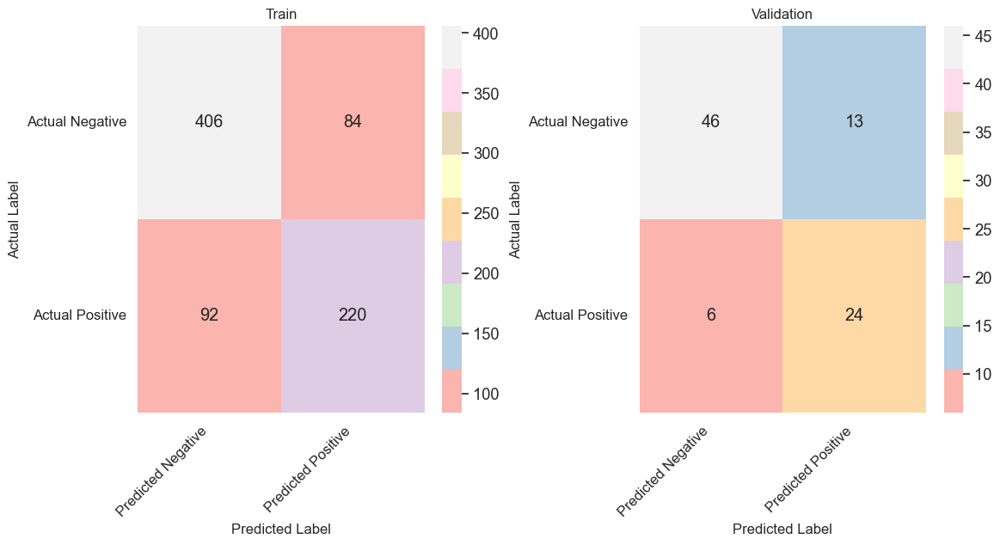

,Train,Validation
Precision,0.723684,0.648649
Recall,0.705128,0.800000
Specificity,0.828571,0.779661
False Positive Rate,0.171429,0.220339
Accuracy,0.780549,0.786517
F1 Score,0.714286,0.716418
Balanced Accuracy,0.766850,0.789831


Mean CV Validation Score: 0.78
Mean CV Validation Loss: 0.52
Mean CV Training Score: 0.78
Mean CV Training Loss: 0.52


In [70]:
bestSubsetOfFeatures, validationScore, validationLoss, trainingScore, trainingLoss = findBestFeatureSubsetAndAnalyze(scaledFeatures, target)

# Elevating SGD Classifier with Precision Grid Search Optimization

In [71]:
def performGridSearch(bestSubsetOfFeatures, target):
    hyperParameters = {'penalty': ('l2', 'l1', 'elasticnet'), 'alpha': [0.0001, 0.001, 0.01, 0.1]}
    gridSearchModel = GridSearchCV(SGDClassifier(random_state=1), hyperParameters).fit(bestSubsetOfFeatures, target)
    print('Accuracy score for classification:')
    print('Grid Search Model:', gridSearchModel.best_score_)
    print('Best Parameters:', gridSearchModel.best_params_)

In [72]:
hyperParameters = performGridSearch(bestSubsetOfFeatures, target)

Accuracy score for classification:
Grid Search Model: 0.7901073378946707
Best Parameters: {'alpha': 0.001, 'penalty': 'l1'}


# Elevating SGD Classifier with Strategic Random Search Tuning

In [73]:
def performRandomSearch(bestSubsetOfFeatures, target):
    numpy.random.seed(1)
    distributions = dict(alpha=uniform(loc=0, scale=1), penalty=['l2', 'l1', 'elasticnet'])
    randomSearchModel = RandomizedSearchCV(SGDClassifier(), distributions, random_state=1).fit(bestSubsetOfFeatures, target)
    print('Accuracy score for classification:')
    print('Random Search Model:', randomSearchModel.best_score_)
    print('Best Parameters:', randomSearchModel.best_params_)

In [74]:
performRandomSearch(bestSubsetOfFeatures, target)

Accuracy score for classification:
Random Search Model: 0.7867491055175444
Best Parameters: {'alpha': 0.417022004702574, 'penalty': 'l2'}


We can see that the Grid Search give a better calculateAccuracy so we can choose his hyper parameters.

# A Comparative Analysis of Bagging Techniques in Classification Accuracy

In [75]:
def displayNFoldBaggingScore(bestSubsetOfFeatures, target):
    baggingModelWithNFolds = BaggingClassifier(
        estimator=SGDClassifier(penalty='elasticnet', alpha=0.001),
        n_estimators=20,
        random_state=1,
        bootstrap=False
    ).fit(bestSubsetOfFeatures, target)
    
    print('Accuracy score for classification:')
    print('N-Fold Bagging Model:', baggingModelWithNFolds.score(bestSubsetOfFeatures, target))
    
    validationScore, validationLoss, trainingScore, trainingLoss = analyzeModelWithCrossValidation(
        bestSubsetOfFeatures, target, baggingModelWithNFolds, folds=10, parameter=None, displayGraphs=True, useProgressBar=True
    )
    print(f'Mean CV Validation Score: {validationScore:.2f}\nMean CV Validation Loss: {validationLoss:.2f}')
    print(f'Mean CV Training Score: {trainingScore:.2f}\nMean CV Training Loss: {trainingLoss:.2f}')

Accuracy score for classification:
N-Fold Bagging Model: 0.7890011223344556


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

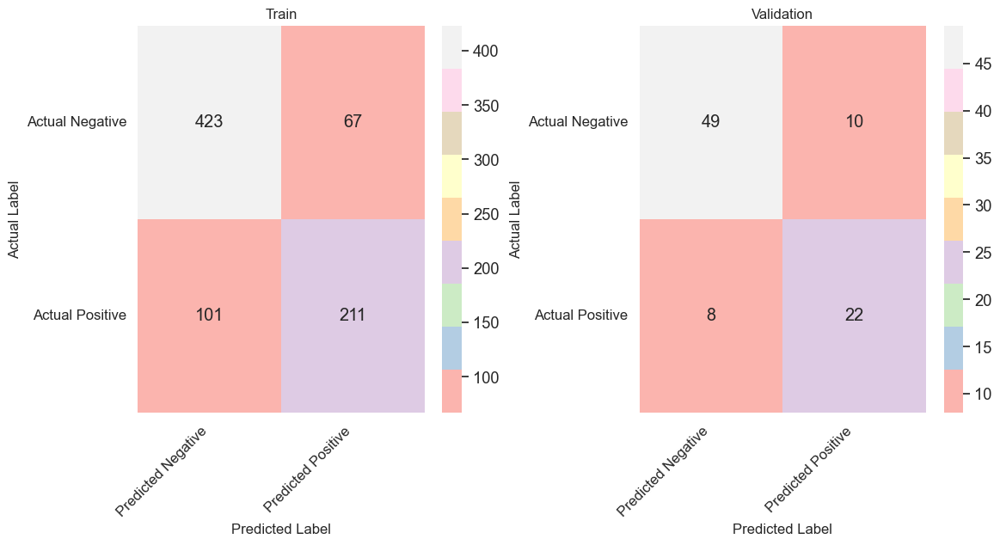

,Train,Validation
Precision,0.758993,0.687500
Recall,0.676282,0.733333
Specificity,0.863265,0.830508
False Positive Rate,0.136735,0.169492
Accuracy,0.790524,0.797753
F1 Score,0.715254,0.709677
Balanced Accuracy,0.769774,0.781921


Mean CV Validation Score: 0.79
Mean CV Validation Loss: 6.58
Mean CV Training Score: 0.79
Mean CV Training Loss: 6.48


In [76]:
displayNFoldBaggingScore(bestSubsetOfFeatures, target)

In [77]:
def displayBootstrapBaggingScore(bestSubsetOfFeatures, target):
    bootstrapBaggingModel = BaggingClassifier(
        estimator=SGDClassifier(penalty='elasticnet', alpha=0.001),
        n_estimators=20,
        random_state=1,
        bootstrap=True
    ).fit(bestSubsetOfFeatures, target)
    print('Accuracy score for classification:')
    print('Bootstrap Bagging Model:', bootstrapBaggingModel.score(bestSubsetOfFeatures, target))
    
    validationScore, validationLoss, trainingScore, trainingLoss = analyzeModelWithCrossValidation(
        bestSubsetOfFeatures, target, bootstrapBaggingModel, folds=10, parameter=None, displayGraphs=True, useProgressBar=True
    )
    print(f'Mean CV Validation Score: {validationScore:.2f}\nMean CV Validation Loss: {validationLoss:.2f}')
    print(f'Mean CV Training Score: {trainingScore:.2f}\nMean CV Training Loss: {trainingLoss:.2f}')


Accuracy score for classification:
Bootstrap Bagging Model: 0.7867564534231201


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

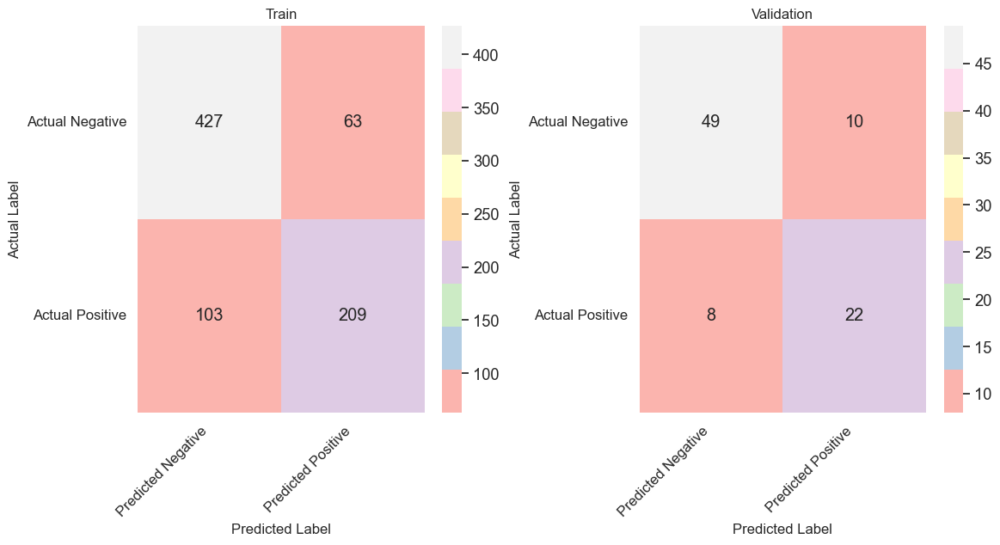

,Train,Validation
Precision,0.768382,0.687500
Recall,0.669872,0.733333
Specificity,0.871429,0.830508
False Positive Rate,0.128571,0.169492
Accuracy,0.793017,0.797753
F1 Score,0.715753,0.709677
Balanced Accuracy,0.770650,0.781921


Mean CV Validation Score: 0.79
Mean CV Validation Loss: 4.59
Mean CV Training Score: 0.79
Mean CV Training Loss: 4.81


In [78]:
displayBootstrapBaggingScore(bestSubsetOfFeatures, target)

# Leveraging AdaBoost for Optimal Classification Results

In [79]:
def getScoreWithAdaBoosting(bestSubsetOfFeatures, target):
    adaBoostModel = AdaBoostClassifier(
        n_estimators=100, 
        random_state=1, 
        algorithm='SAMME'
    ).fit(bestSubsetOfFeatures, target)
    
    print('Accuracy score for classification:')
    print('Ada Boost Model:', adaBoostModel.score(bestSubsetOfFeatures, target))
    
    validationScore, validationLoss, trainingScore, trainingLoss = analyzeModelWithCrossValidation(
        bestSubsetOfFeatures, target, adaBoostModel, folds=10, parameter=None, displayGraphs=True, useProgressBar=True
    )
    print(f'Mean CV Validation Score: {validationScore:.2f}\nMean CV Validation Loss: {validationLoss:.2f}')
    print(f'Mean CV Training Score: {trainingScore:.2f}\nMean CV Training Loss: {trainingLoss:.2f}')

Accuracy score for classification:
Ada Boost Model: 0.8013468013468014


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

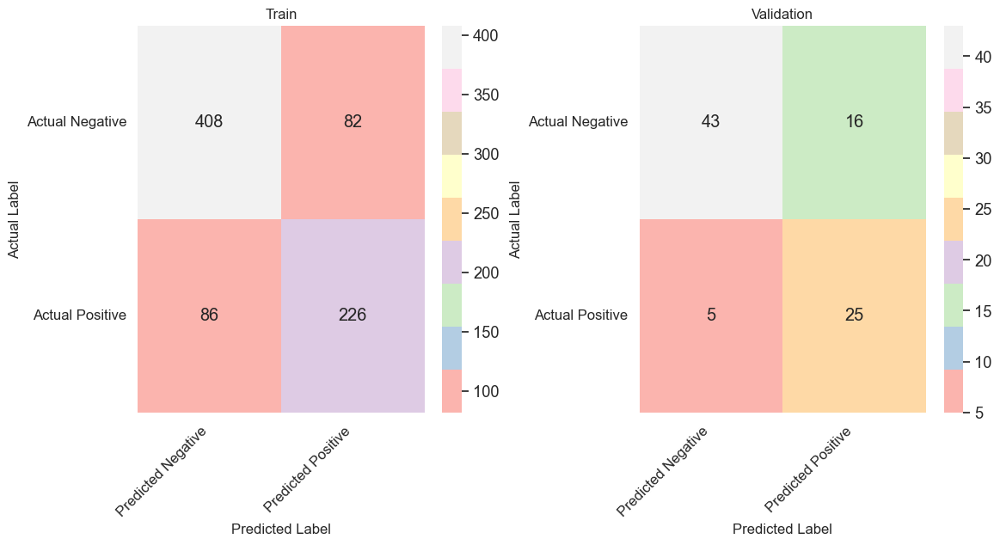

,Train,Validation
Precision,0.733766,0.609756
Recall,0.724359,0.833333
Specificity,0.832653,0.728814
False Positive Rate,0.167347,0.271186
Accuracy,0.790524,0.764045
F1 Score,0.729032,0.704225
Balanced Accuracy,0.778506,0.781073


Mean CV Validation Score: 0.79
Mean CV Validation Loss: 0.55
Mean CV Training Score: 0.80
Mean CV Training Loss: 0.55


In [80]:
getScoreWithAdaBoosting(bestSubsetOfFeatures, target)

# Elevating K-Nearest Neighbors Classification with Optimal Fold Selection

In [81]:
def runKNNAndFindBestFolds(bestSubsetOfFeatures, target):
    hyperParameters = {'n_neighbors': list(range(1, 20))}
    gridSearchKNNModel = GridSearchCV(KNeighborsClassifier(), hyperParameters).fit(bestSubsetOfFeatures, target)
    print('Accuracy score for classification:')
    print('Grid Search KNN Model:', gridSearchKNNModel.best_score_)
    print('Best Parameters:', gridSearchKNNModel.best_params_)
    
    validationScore, validationLoss, trainingScore, trainingLoss = analyzeModelWithCrossValidation(
        bestSubsetOfFeatures, target, gridSearchKNNModel, folds=10, parameter=None, displayGraphs=True, useProgressBar=True
    )
    print(f'Mean CV Validation Score: {validationScore:.2f}\nMean CV Validation Loss: {validationLoss:.2f}')
    print(f'Mean CV Training Score: {trainingScore:.2f}\nMean CV Training Loss: {trainingLoss:.2f}')

Accuracy score for classification:
Grid Search KNN Model: 0.7912937040989266
Best Parameters: {'n_neighbors': 6}


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

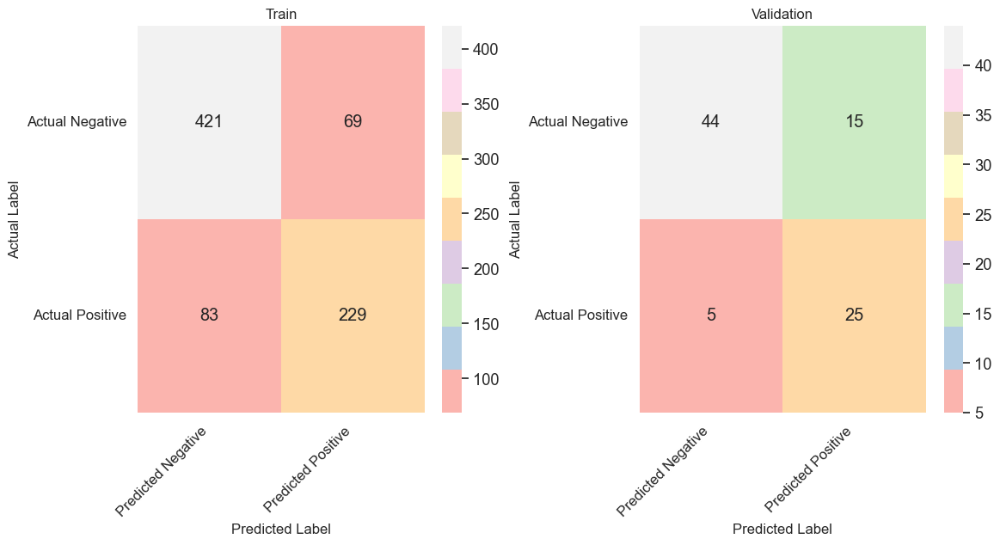

,Train,Validation
Precision,0.768456,0.625000
Recall,0.733974,0.833333
Specificity,0.859184,0.745763
False Positive Rate,0.140816,0.254237
Accuracy,0.810474,0.775281
F1 Score,0.750820,0.714286
Balanced Accuracy,0.796579,0.789548


Mean CV Validation Score: 0.79
Mean CV Validation Loss: 1.43
Mean CV Training Score: 0.83
Mean CV Training Loss: 0.67


In [82]:
runKNNAndFindBestFolds(bestSubsetOfFeatures, target)

# Insights into Multinomial Naive Bayes Accuracy with Feature Engineering

In [83]:
def displayNaiveBayesScore(featureCopy, target, numericalFeatures, allFeatures):
    columnTransformerNBC = ColumnTransformer([("scaling", MinMaxScaler(), numericalFeatures)])
    scaledFeaturesNBC = pandas.DataFrame(columnTransformerNBC.fit_transform(featureCopy, target), columns=allFeatures)
    
    print('MultinomialNB score:', cross_val_score(MultinomialNB(), scaledFeaturesNBC, target, cv=15).mean())

In [84]:
displayNaiveBayesScore(featureCopy, target, numericalFeatures, allFeatures)

MultinomialNB score: 0.6498681732580038


***From the training process, it is evident that the application of Feature Selection techniques has led to the identification of only 6 pertinent features. Subsequently, I employed the optimal parameters, as determined through Grid Search, for each of the models that were trained. Based on the outcomes of cross-validation and the accuracy calculations, the AdaBoost model emerged as the superior choice. Therefore, we will proceed with utilizing the AdaBoost model for predicting the outcomes on the test dataset.***

# Test Classification

In [85]:
model = AdaBoostClassifier(
    n_estimators=100, 
    random_state=1, 
    algorithm='SAMME'
).fit(bestSubsetOfFeatures, target)

In [86]:
def predictTestUsingAdaBoost(testCopy, selectedFeatures, model):
    featuresSelectedTest = testCopy[bestSubsetOfFeatures.columns]
    numericalFeaturesTest = featuresSelectedTest.select_dtypes(include=['int64', 'float64']).columns
    categoricalFeaturesTest = featuresSelectedTest.select_dtypes(include=['object', 'bool']).columns
    allFeaturesTest = list(categoricalFeaturesTest) + list(numericalFeaturesTest)
    
    standardScalerTransformerTest = ColumnTransformer([("standard", StandardScaler(), numericalFeaturesTest)])
    encodedFeaturesTest = pandas.DataFrame(standardScalerTransformerTest.fit_transform(featuresSelectedTest), columns=allFeaturesTest)
    
    submissionPredictions = model.predict(encodedFeaturesTest)
    return submissionPredictions

In [87]:
submissionPredictions = predictTestUsingAdaBoost(testCopy, bestSubsetOfFeatures, model)

# Preparing the Submission CSV File

In [88]:
def export(submissionPassengerId, submissionPredictions, outputFile='Repository/submission.csv'):
    submission = pandas.DataFrame({
        'PassengerId': submissionPassengerId,
        'Survived': submissionPredictions
    })
    submission.to_csv(outputFile, index=False)
    display(submission)

In [89]:
export(submissionPassengerId, submissionPredictions)

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
...,...,...
413,1305,0
414,1306,1
415,1307,0
416,1308,0


# Leaderboard

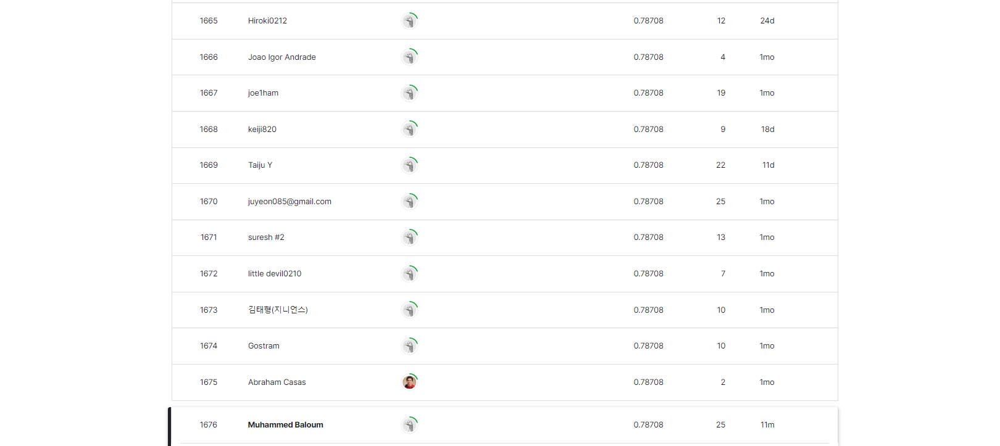

# Summary

***Following an in-depth analysis and examination of the dataset in the preceding exercise, I discovered that incorporating the 'IsAlone' attribute significantly enhanced the predictive accuracy of our models. Consequently, I decided to persist with training models that included this particular feature. Utilizing feature selection techniques allowed me to ascertain the indispensability of the 'IsAlone' feature, ensuring it remained within the suite of selected attributes. Upon executing the feature selection process, I meticulously identified the most impactful features, which then served as the foundation for training various models. To rigorously evaluate their performance, I employed cross-validation techniques across these models, aiming to pinpoint the one that exhibited the most promising predictive capabilities on the test dataset.***

***After a comprehensive series of training sessions and evaluations, the AdaBoost model emerged as the standout performer, showcasing superior results compared to its counterparts. Motivated by its exceptional performance, I chose the AdaBoost model as my preferred tool for making submissionPredictions on the test dataset. This decision was underpinned by a strategic and methodical approach to feature selection and model evaluation, ensuring a robust and well-informed predictive model.***

# References

***Titanic Survival (Everything That You Need to Know) by Arbaz Khan***: A comprehensive guide covering various aspects of Titanic survival analysis.
https://www.kaggle.com/code/arbazkhan971/titanic-survival-everything-that-you-need-to-know?scriptVersionId=53228062

***Confusion Matrix Analysis by vinceallenvince***: Titanic - Guided by a Confusion Matrix
https://www.kaggle.com/vinceallenvince/titanic-guided-by-a-confusion-matrix

***Cross-Validation, Hyperparameter Tuning, and Ensemble Methods by Mohammed Innat***: Kaggle Titanic: Machine Learning from Disaster | Modeling Part 2
https://www.codementor.io/@innat_2k14/kaggl-titanic-a-machine-learning-from-disaster-modelling-part-2-10gfjtm0p3

In [90]:
# %%shell
# jupyter nbconvert --to html TitanicAnalysis.ipynb